In [318]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from statsmodels.stats.outliers_influence import variance_inflation_factor
import itertools

In [2]:
appearances = pd.read_csv("./archive/appearances.csv")
club_games = pd.read_csv("./archive/club_games.csv")
clubs = pd.read_csv("./archive/clubs.csv")
competitions = pd.read_csv("./archive/competitions.csv")
game_events = pd.read_csv("./archive/game_events.csv")
game_lineups = pd.read_csv("./archive/game_lineups.csv")
games = pd.read_csv("./archive/games.csv")
player_valuations = pd.read_csv("./archive/player_valuations.csv")
players = pd.read_csv("./archive/players.csv")

# 마스터 테이블을 만들어보자

In [3]:
df = pd.DataFrame()
df = games

In [4]:
df = df.drop(columns=['home_club_manager_name',
                      'away_club_manager_name', 
                      'stadium', 
                      'referee', 
                      'url', 
                      'home_club_name',
                      'away_club_name'])

In [5]:
# 경기별 엘로 / 레드 카드 수 컬럼 추가
card_groupby = appearances.groupby("game_id").agg({'yellow_cards' : 'sum', "red_cards" : 'sum'})
df = pd.merge(df, card_groupby, on="game_id", how = 'left')

In [6]:
# 경기별 순위 격차 (홈 - 어웨이) 컬럼 추가
df["position_differ"] = df["home_club_position"] - df["away_club_position"]

In [7]:
# is_win 추가
club_win = club_games[["game_id","club_id", "is_win"]]
win_merge = pd.merge(club_win, games, on="game_id")
is_win = win_merge[win_merge["club_id"] == win_merge["home_club_id"]][["game_id", "is_win"]]
df = pd.merge(df, is_win, on="game_id")

In [8]:
df = pd.merge(df, competitions, on="competition_id", how="left")

df = df.drop(columns=[
    "competition_id", 
    "competition_code", 
    "sub_type", 
    "type", 
    "country_id", 
    "domestic_league_code", 
    "confederation", 
    "url"  
])

In [9]:
# 경기별 각 클럽의 선수 몸값 총합

#appearances에서 경기별 선수 ID를 player_value 테이블에 있는 그 시즌의 몸값으로 가격을 가져와서 게임ID, 클럽ID별로 합산

value = pd.merge(appearances, player_valuations, on="player_id", how="left")

value_drop = value.drop(columns=[
    "player_club_domestic_competition_id",
    "current_club_id",
    "appearance_id",
    "player_current_club_id",
    "competition_id",
    "yellow_cards",
    "red_cards",
    "goals",
    "minutes_played",
    "assists"
])

In [10]:
value_drop

,game_id,player_id,player_club_id,date_x,player_name,date_y,market_value_in_eur
0,2231978,38004,853,2012-07-03,Aurélien Joachim,2006-02-15,75000.0
1,2231978,38004,853,2012-07-03,Aurélien Joachim,2009-01-11,75000.0
2,2231978,38004,853,2012-07-03,Aurélien Joachim,2010-01-04,175000.0
3,2231978,38004,853,2012-07-03,Aurélien Joachim,2012-10-09,300000.0
4,2231978,38004,853,2012-07-03,Aurélien Joachim,2013-01-17,500000.0
...,...,...,...,...,...,...,...
38483604,4129679,88374,589,2024-02-26,Veysel Sarı,2022-10-27,475000.0
38483605,4129679,88374,589,2024-02-26,Veysel Sarı,2023-03-14,500000.0
38483606,4129679,88374,589,2024-02-26,Veysel Sarı,2023-06-08,500000.0
38483607,4129679,88374,589,2024-02-26,Veysel Sarı,2023-09-27,400000.0


In [11]:
# 특정 선수가 어느 경기에 어떤 클럽과 마켓 밸류를 갖고 있는지 구한다.
filtered_value = value_drop[value_drop["date_x"] > value_drop["date_y"]]

In [12]:
filtered_value

,game_id,player_id,player_club_id,date_x,player_name,date_y,market_value_in_eur
0,2231978,38004,853,2012-07-03,Aurélien Joachim,2006-02-15,75000.0
1,2231978,38004,853,2012-07-03,Aurélien Joachim,2009-01-11,75000.0
2,2231978,38004,853,2012-07-03,Aurélien Joachim,2010-01-04,175000.0
20,2233748,79232,8841,2012-07-05,Ruslan Abyshov,2009-10-11,300000.0
21,2233748,79232,8841,2012-07-05,Ruslan Abyshov,2012-06-27,400000.0
...,...,...,...,...,...,...,...
38483604,4129679,88374,589,2024-02-26,Veysel Sarı,2022-10-27,475000.0
38483605,4129679,88374,589,2024-02-26,Veysel Sarı,2023-03-14,500000.0
38483606,4129679,88374,589,2024-02-26,Veysel Sarı,2023-06-08,500000.0
38483607,4129679,88374,589,2024-02-26,Veysel Sarı,2023-09-27,400000.0


In [13]:
filtered_value['date_y'] = pd.to_datetime(filtered_value['date_y'])

latest_value = filtered_value.loc[filtered_value.groupby(['game_id', 'player_id', 'player_club_id'])['date_y'].idxmax()]

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/173855841.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_value['date_y'] = pd.to_datetime(filtered_value['date_y'])


In [14]:
# 특정 경기에 따른 각 선수가 속한 클럽 및 몸값 결과
latest_value

,game_id,player_id,player_club_id,date_x,player_name,date_y,market_value_in_eur
77645,2211607,3515,383,2012-08-05,Mark van Bommel,2012-07-03,800000.0
77762,2211607,4338,383,2012-08-05,Wilfred Bouma,2012-07-11,2000000.0
77776,2211607,4425,610,2012-08-05,Theo Janssen,2012-06-30,5000000.0
77254,2211607,12282,610,2012-08-05,Daley Blind,2012-06-30,1250000.0
77379,2211607,16101,383,2012-08-05,Atiba Hutchinson,2010-06-03,3500000.0
...,...,...,...,...,...,...,...
38419225,4280460,468301,1091,2024-02-21,Marcos Antônio,2023-12-20,7000000.0
38419239,4280460,532444,265,2024-02-21,Fotis Ioannidis,2023-12-20,9000000.0
38419250,4280460,546186,265,2024-02-21,Georgios Vagiannidis,2023-12-20,2200000.0
38419258,4280460,628331,1091,2024-02-21,Giannis Konstantelias,2023-12-20,10000000.0


In [15]:
df_value = pd.merge(df, latest_value, on="game_id", how="left")

In [16]:
df_sum = df_value.groupby(["game_id", "player_club_id"]).agg({"market_value_in_eur" : "sum"})
df_sum = df_sum.rename(columns = {"market_value_in_eur" : "total_club_value(eur)"})

In [17]:
df_sum = df_sum.reset_index()

In [18]:
df_sum_home_away = pd.merge(df_sum, games, on="game_id", how="left")

df_sum_home_away = df_sum_home_away.drop(columns=[
    "competition_id",
    "season",
    "round",
    "home_club_goals",
    "stadium",
    "attendance",
    "referee",
    "url",
    "home_club_formation",
    "away_club_formation",
    "home_club_name",
    "away_club_name",
    "aggregate",
    "competition_type",
    'away_club_goals',
    'home_club_position', 
    'away_club_position', 
    'home_club_manager_name',
    'away_club_manager_name',
])

df_sum_home_away["player_club_id"] = df_sum_home_away["player_club_id"].astype(int)

In [19]:
filtered_values_away = pd.DataFrame({"game_id" : df_sum_home_away.loc[df_sum_home_away['player_club_id'] == df_sum_home_away['away_club_id'], 'game_id'], 
                                   "away_total_market_value" : df_sum_home_away.loc[df_sum_home_away['player_club_id'] == df_sum_home_away['away_club_id'], 'total_club_value(eur)']
                                    })

In [20]:
filtered_values_home = pd.DataFrame({"game_id" : df_sum_home_away.loc[df_sum_home_away['player_club_id'] == df_sum_home_away['home_club_id'], 'game_id'], 
                                   "home_total_market_value" : df_sum_home_away.loc[df_sum_home_away['player_club_id'] == df_sum_home_away['home_club_id'], 'total_club_value(eur)']
                                    })

In [21]:
filtered_values_exit = pd.merge(filtered_values_away, filtered_values_home, on="game_id", how="outer")

In [22]:
df = pd.merge(df, filtered_values_exit, on="game_id", how="left")

In [23]:
df["market_value_differ"] = df["home_total_market_value"] - df["away_total_market_value"]

In [24]:
df.drop(columns=[
    "name"
])

,game_id,season,round,date,home_club_id,away_club_id,home_club_goals,away_club_goals,home_club_position,away_club_position,...,aggregate,competition_type,yellow_cards,red_cards,position_differ,is_win,country_name,away_total_market_value,home_total_market_value,market_value_differ
0,2321044,2013,2. Matchday,2013-08-18,16,23,2,1,1.0,15.0,...,2:1,domestic_league,1.0,0.0,-14.0,1,Germany,16450000.0,211100000.0,194650000.0
1,2321060,2013,3. Matchday,2013-08-25,23,24,0,2,18.0,11.0,...,0:2,domestic_league,3.0,0.0,7.0,0,Germany,55500000.0,18050000.0,-37450000.0
2,2321086,2013,6. Matchday,2013-09-21,4,16,1,1,15.0,1.0,...,1:1,domestic_league,3.0,0.0,14.0,0,Germany,184200000.0,32800000.0,-151400000.0
3,2321152,2013,11. Matchday,2013-11-02,44,33,0,2,7.0,6.0,...,0:2,domestic_league,4.0,0.0,1.0,0,Germany,119250000.0,29050000.0,-90200000.0
4,2321205,2013,17. Matchday,2013-12-21,41,39,2,3,14.0,9.0,...,2:3,domestic_league,4.0,0.0,5.0,0,Germany,21600000.0,57100000.0,35500000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66788,2629035,2015,Third Round,2015-10-27,383,16866,6,0,NaN,NaN,...,6:0,domestic_cup,0.0,0.0,NaN,1,Netherlands,NaN,44400000.0,NaN
66789,3092951,2018,Qualifying Round 2nd leg,2018-08-29,383,713,3,0,NaN,NaN,...,3:0,international_cup,1.0,0.0,NaN,1,NaN,1200000.0,103250000.0,102050000.0
66790,4164101,2023,Second Round,2023-08-29,512,1194,6,1,NaN,NaN,...,6:1,other,0.0,0.0,NaN,1,England,500000.0,NaN,NaN
66791,3143618,2018,Third Round Replay,2019-01-15,512,3054,2,3,NaN,NaN,...,2:3,domestic_cup,0.0,0.0,NaN,0,England,600000.0,4500000.0,3900000.0


In [25]:
# 경기별로 각 클럽당 외국인 비율

app = appearances.groupby(["game_id", "player_club_id"]).agg({"player_id" : "count"})
app.sort_values(by=["game_id", "player_id"])

player_id
game_id player_club_id           
2211607 383                    13
        610                    14
2218677 506                    14
        6195                   14
2219794 58                     14
...                           ...
4280255 605                    16
4280459 265                    16
        1091                   16
4280460 265                    17
        1091                   17

[115017 rows x 1 columns]

<Axes: ylabel='Count'>

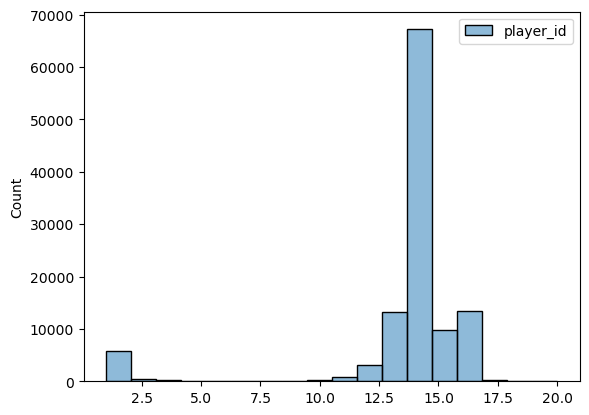

In [26]:
sns.histplot(app)

#일단 대부분 11명보다 많은 것 같아서 일단은 구해 보기로 한다.

In [27]:
#각 게임별 각 선수별 출신지가 어딘지 구해보자

latest_value_foreign = pd.merge(latest_value, players, on="player_id", how="left")

latest_value_foreign = latest_value_foreign.drop(columns=[
    'first_name', 'last_name', 'name',
       'last_season', 'current_club_id', 'player_code', 
    'sub_position', 'position',
    'contract_expiration_date', 'agent_name', 'image_url', 'url',
       'current_club_domestic_competition_id', 'current_club_name',
       'market_value_in_eur_y', 'highest_market_value_in_eur'
])

In [28]:
# 게임ID의 각 클럽이 속한 리그의 국가를 알아낸다 
# 먼저 latest_value_foreign을 game_id를 통해 games 테이블에 있는 competition_id를 구하고
# games의 competitoin_id을 통해 competition 테이블에 있는 competition_id 별 국가를 알아낸다.
latest_value_foreign_competition = pd.merge(latest_value_foreign, games, on="game_id", how="left")

latest_value_foreign_competition = latest_value_foreign_competition.drop(columns=[
    'season', 'round', 'date', 'home_club_id',
       'away_club_id', 'home_club_goals', 'away_club_goals',
       'home_club_position', 'away_club_position', 'home_club_manager_name',
       'away_club_manager_name', 'stadium', 'attendance', 'referee', 'url',
       'home_club_formation', 'away_club_formation', 'home_club_name',
       'away_club_name', 'aggregate', 'competition_type'
])

In [29]:
latest_value_foreign_competition

,game_id,player_id,player_club_id,date_x,player_name,date_y,market_value_in_eur_x,country_of_birth,city_of_birth,country_of_citizenship,date_of_birth,foot,height_in_cm,competition_id
0,2211607,3515,383,2012-08-05,Mark van Bommel,2012-07-03,800000.0,Netherlands,Maasbracht,Netherlands,1977-04-22,right,186.0,NLSC
1,2211607,4338,383,2012-08-05,Wilfred Bouma,2012-07-11,2000000.0,Netherlands,Helmond,Netherlands,1978-06-15,left,181.0,NLSC
2,2211607,4425,610,2012-08-05,Theo Janssen,2012-06-30,5000000.0,Netherlands,Arnhem,Netherlands,1981-07-27,left,180.0,NLSC
3,2211607,12282,610,2012-08-05,Daley Blind,2012-06-30,1250000.0,Netherlands,Amsterdam,Netherlands,1990-03-09,left,180.0,NLSC
4,2211607,16101,383,2012-08-05,Atiba Hutchinson,2010-06-03,3500000.0,NaN,"Brampton, Ontario",NaN,1983-02-08,right,187.0,NLSC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1528046,4280460,468301,1091,2024-02-21,Marcos Antônio,2023-12-20,7000000.0,Brazil,Poções,Brazil,2000-06-13,right,166.0,GRP
1528047,4280460,532444,265,2024-02-21,Fotis Ioannidis,2023-12-20,9000000.0,Greece,Athen,Greece,2000-01-10,both,187.0,GRP
1528048,4280460,546186,265,2024-02-21,Georgios Vagiannidis,2023-12-20,2200000.0,Greece,Athens,Greece,2001-09-12,right,182.0,GRP
1528049,4280460,628331,1091,2024-02-21,Giannis Konstantelias,2023-12-20,10000000.0,Greece,Volos,Greece,2003-03-05,both,178.0,GRP


In [30]:
latest_value_foreign_country = pd.merge(latest_value_foreign_competition, competitions, on="competition_id", how="left")

latest_value_foreign_country = latest_value_foreign_country.drop(columns=[
    'country_of_birth', 'city_of_birth', 'competition_code', 'name', 'sub_type', 'type',
       'country_id','domestic_league_code', 'confederation',
       'url'
])

In [31]:
# 이걸 왜 했냐면, 클럽별 country_of_citizenship와 country_name이 다른 선수의 개수를 구하기 위해..

latest_value_foreign_country

,game_id,player_id,player_club_id,date_x,player_name,date_y,market_value_in_eur_x,country_of_citizenship,date_of_birth,foot,height_in_cm,competition_id,country_name
0,2211607,3515,383,2012-08-05,Mark van Bommel,2012-07-03,800000.0,Netherlands,1977-04-22,right,186.0,NLSC,Netherlands
1,2211607,4338,383,2012-08-05,Wilfred Bouma,2012-07-11,2000000.0,Netherlands,1978-06-15,left,181.0,NLSC,Netherlands
2,2211607,4425,610,2012-08-05,Theo Janssen,2012-06-30,5000000.0,Netherlands,1981-07-27,left,180.0,NLSC,Netherlands
3,2211607,12282,610,2012-08-05,Daley Blind,2012-06-30,1250000.0,Netherlands,1990-03-09,left,180.0,NLSC,Netherlands
4,2211607,16101,383,2012-08-05,Atiba Hutchinson,2010-06-03,3500000.0,NaN,1983-02-08,right,187.0,NLSC,Netherlands
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1528046,4280460,468301,1091,2024-02-21,Marcos Antônio,2023-12-20,7000000.0,Brazil,2000-06-13,right,166.0,GRP,Greece
1528047,4280460,532444,265,2024-02-21,Fotis Ioannidis,2023-12-20,9000000.0,Greece,2000-01-10,both,187.0,GRP,Greece
1528048,4280460,546186,265,2024-02-21,Georgios Vagiannidis,2023-12-20,2200000.0,Greece,2001-09-12,right,182.0,GRP,Greece
1528049,4280460,628331,1091,2024-02-21,Giannis Konstantelias,2023-12-20,10000000.0,Greece,2003-03-05,both,178.0,GRP,Greece


In [32]:
# country name이 너무 null 값이 많아서 좀 채워야 할 것 같다.
latest_value_foreign_country.isnull().sum()

game_id                        0
player_id                      0
player_club_id                 0
date_x                         0
player_name                    0
date_y                         0
market_value_in_eur_x          0
country_of_citizenship     33165
date_of_birth                602
foot                       20795
height_in_cm               16091
competition_id                 0
country_name              111056
dtype: int64

In [33]:
competitions[["competition_id", "country_name"]]

,competition_id,country_name
0,CIT,Italy
1,NLSC,Netherlands
2,GRP,Greece
3,POSU,Portugal
4,RUSS,Russia
5,SUC,Spain
6,USC,NaN
7,DK1,Denmark
8,EL,NaN
9,ES1,Spain


In [34]:
# 작전을 수정해서 clubs의 domestic_id에 해당하는 나라를 clubs에 넣고 club 별로 계산해보자
competitions["domestic_league_code"].unique()

array(['IT1', 'NL1', 'GR1', 'PO1', 'RU1', 'ES1', nan, 'DK1', 'FR1', 'BE1',
       'GB1', 'UKR1', 'TR1', 'L1', 'SC1'], dtype=object)

In [35]:
competitions[competitions["domestic_league_code"] == "UKR1"]["country_name"]

23    Ukraine
24    Ukraine
40    Ukraine
Name: country_name, dtype: object

In [36]:
league_list = pd.DataFrame({
    "domestic_competition_id" : ['L1' ,'RU1', 'TR1', 'IT1', 'GB1', 'BE1', 'DK1', 'NL1', 'GR1', 'PO1', 'SC1','ES1', 'UKR1', "FR1"],
    "country_name" : ["Germany", "Russia", "Turkey", "Italy", "England", "Belgium", "Denmark", "Netherlands", "Greece", "Portugal","Scotland", "Spain", "Ukraine","France"] 
                           }) 

league_list

,domestic_competition_id,country_name
0,L1,Germany
1,RU1,Russia
2,TR1,Turkey
3,IT1,Italy
4,GB1,England
5,BE1,Belgium
6,DK1,Denmark
7,NL1,Netherlands
8,GR1,Greece
9,PO1,Portugal


In [37]:
club_country = pd.merge(clubs, league_list, on="domestic_competition_id", how="left")

club_country = club_country.rename(columns={"club_id" : "player_club_id"})

In [38]:
latest_value_foreign_country = pd.merge(latest_value_foreign, club_country, on="player_club_id", how="left")

latest_value_foreign_country=latest_value_foreign_country.drop(columns=[
    'stadium_name',
       'stadium_seats', 'net_transfer_record', 'coach_name', 'last_season',
       'filename', 'url','club_code', 'name', 'domestic_competition_id', 'total_market_value',
       'squad_size', 'average_age', 'foreigners_number',
       'foreigners_percentage', 'national_team_players'
])

In [39]:
latest_value_foreign_country

,game_id,player_id,player_club_id,date_x,player_name,date_y,market_value_in_eur_x,country_of_birth,city_of_birth,country_of_citizenship,date_of_birth,foot,height_in_cm,country_name
0,2211607,3515,383,2012-08-05,Mark van Bommel,2012-07-03,800000.0,Netherlands,Maasbracht,Netherlands,1977-04-22,right,186.0,Netherlands
1,2211607,4338,383,2012-08-05,Wilfred Bouma,2012-07-11,2000000.0,Netherlands,Helmond,Netherlands,1978-06-15,left,181.0,Netherlands
2,2211607,4425,610,2012-08-05,Theo Janssen,2012-06-30,5000000.0,Netherlands,Arnhem,Netherlands,1981-07-27,left,180.0,Netherlands
3,2211607,12282,610,2012-08-05,Daley Blind,2012-06-30,1250000.0,Netherlands,Amsterdam,Netherlands,1990-03-09,left,180.0,Netherlands
4,2211607,16101,383,2012-08-05,Atiba Hutchinson,2010-06-03,3500000.0,NaN,"Brampton, Ontario",NaN,1983-02-08,right,187.0,Netherlands
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1528046,4280460,468301,1091,2024-02-21,Marcos Antônio,2023-12-20,7000000.0,Brazil,Poções,Brazil,2000-06-13,right,166.0,Greece
1528047,4280460,532444,265,2024-02-21,Fotis Ioannidis,2023-12-20,9000000.0,Greece,Athen,Greece,2000-01-10,both,187.0,Greece
1528048,4280460,546186,265,2024-02-21,Georgios Vagiannidis,2023-12-20,2200000.0,Greece,Athens,Greece,2001-09-12,right,182.0,Greece
1528049,4280460,628331,1091,2024-02-21,Giannis Konstantelias,2023-12-20,10000000.0,Greece,Volos,Greece,2003-03-05,both,178.0,Greece


In [40]:
latest_value_foreign_country.isnull().sum()

game_id                       0
player_id                     0
player_club_id                0
date_x                        0
player_name                   0
date_y                        0
market_value_in_eur_x         0
country_of_birth          51778
city_of_birth             18825
country_of_citizenship    33165
date_of_birth               602
foot                      20795
height_in_cm              16091
country_name               7046
dtype: int64

In [41]:
#이제 선수 국적과 리그 국적이 다른 경우를 계산해보자

latest_value_foreign_country = latest_value_foreign_country.dropna()

condition = latest_value_foreign_country["country_of_citizenship"] != latest_value_foreign_country["country_name"]

latest_value_foreign_country_diff = pd.DataFrame({
    "game_id" : latest_value_foreign_country.loc[condition, "game_id"],
    "player_club_id" : latest_value_foreign_country.loc[condition, "player_club_id"],
    "diff" : latest_value_foreign_country.loc[condition, "player_id"]
})

In [42]:
latest_value_foreign_country_diff

,game_id,player_club_id,diff
6,2211607,610,30670
7,2211607,383,33210
8,2211607,610,34784
9,2211607,383,36500
11,2211607,610,42710
...,...,...,...
1528039,4280460,1091,251680
1528040,4280460,265,262861
1528042,4280460,1091,370997
1528043,4280460,265,381348


In [43]:
latest_value_foreign_country_diff_gb = latest_value_foreign_country_diff.groupby(
    ["game_id","player_club_id"]).agg({"diff" : "count"}
)

latest_value_foreign_country_diff_gb.sort_values(by=["game_id", "player_club_id"])

diff
game_id player_club_id      
2211607 383                4
        610                6
2218677 506                4
        6195              10
2219794 58                10
...                      ...
4280255 6418               8
4280459 265               12
        1091              14
4280460 265               11
        1091              14

[107998 rows x 1 columns]

In [44]:
latest_value_foreign_country_total = pd.DataFrame({
    "game_id" : latest_value_foreign_country["game_id"],
    "player_club_id" : latest_value_foreign_country["player_club_id"],
    "total_player_per_game" : latest_value_foreign_country["player_id"]
})

latest_value_foreign_country_total_gb = latest_value_foreign_country_total.groupby(
    ["game_id","player_club_id"]).agg({ "total_player_per_game" : "count"}
)

latest_value_foreign_country_total_gb.sort_values(by=["game_id", "player_club_id"])

total_player_per_game
game_id player_club_id                       
2211607 383                                11
        610                                14
2218677 506                                13
        6195                               14
2219794 58                                 14
...                                       ...
4280255 6418                               12
4280459 265                                16
        1091                               16
4280460 265                                17
        1091                               17

[109789 rows x 1 columns]

In [45]:
foreign_merged = pd.merge(latest_value_foreign_country_diff_gb, latest_value_foreign_country_total_gb, on=["game_id", "player_club_id"], how="inner")

foreign_merged = foreign_merged.rename(columns={
    "diff" : "foreign_players"
})

In [46]:
# 이제 이걸 df에 잘 합치면 된다.
ungrouped_df =foreign_merged.reset_index()

In [47]:
merged_df = pd.merge(ungrouped_df, games, on="game_id", how="left")

merged_df = merged_df.drop(columns=[
    'competition_id', 'season', 'round', 'date',
    'home_club_goals', 'away_club_goals',
       'home_club_position', 'away_club_position', 'home_club_manager_name',
       'away_club_manager_name', 'stadium', 'attendance', 'referee', 'url',
       'home_club_formation', 'away_club_formation', 'home_club_name',
       'away_club_name', 'aggregate', 'competition_type'
])

In [48]:
merged_df

,game_id,player_club_id,foreign_players,total_player_per_game,home_club_id,away_club_id
0,2211607,383,4,11,383,610
1,2211607,610,6,14,383,610
2,2218677,506,4,13,506,6195
3,2218677,6195,10,14,506,6195
4,2219794,58,10,14,58,498
...,...,...,...,...,...,...
107993,4280255,6418,8,12,6418,605
107994,4280459,265,12,16,1091,265
107995,4280459,1091,14,16,1091,265
107996,4280460,265,11,17,265,1091


In [49]:
# home_club만을 구하고
condition_home = merged_df["player_club_id"] == merged_df["home_club_id"]

foreign_home_club = pd.DataFrame({
    "game_id" : merged_df.loc[condition_home, "game_id"],
    "player_club_id" : merged_df.loc[condition_home, "player_club_id"],
    "foreign_players" : merged_df.loc[condition_home, "foreign_players"],
    "total_player_per_game" : merged_df.loc[condition_home, "total_player_per_game"],
    "home_club_id" : merged_df.loc[condition_home, "home_club_id"],
    "away_club_id" : merged_df.loc[condition_home, "away_club_id"]
})

In [50]:
# away_club만을 구해서
condition_away = merged_df["player_club_id"] == merged_df["away_club_id"]

foreign_away_club = pd.DataFrame({
    "game_id" : merged_df.loc[condition_away , "game_id"],
    "player_club_id" : merged_df.loc[condition_away, "player_club_id"],
    "foreign_players" : merged_df.loc[condition_away, "foreign_players"],
    "total_player_per_game" : merged_df.loc[condition_away, "total_player_per_game"],
    "home_club_id" : merged_df.loc[condition_away, "home_club_id"],
    "away_club_id" : merged_df.loc[condition_away, "away_club_id"]
})

In [51]:
# 두 테이블을 합친다
foreign_merge = pd.merge(foreign_home_club, foreign_away_club, on="game_id", how="outer")

foreign_merge = foreign_merge.rename(columns={
    "foreign_players_x" : "home_club_foreign_players",
    "total_player_per_game_x" : "home_club_total_players",
    "foreign_players_y" : "away_club_foreign_players",
    "total_player_per_game_y" : "away_club_total_players"
})

foreign_merge = foreign_merge.drop(columns=[
    'player_club_id_x', 'home_club_id_x', 'away_club_id_x', 'player_club_id_y',
    'home_club_id_y', 'away_club_id_y'
])

In [52]:
#home, away 별로 외국인 비율 구하기
foreign_merge["home_club_foreign%"] = foreign_merge["home_club_foreign_players"] / foreign_merge["home_club_total_players"]
foreign_merge["away_club_foreign%"] = foreign_merge["away_club_foreign_players"] / foreign_merge["away_club_total_players"]

In [53]:
#이제 df랑 합치기
df = pd.merge(df, foreign_merge, on="game_id", how="left")

In [54]:
df

,game_id,season,round,date,home_club_id,away_club_id,home_club_goals,away_club_goals,home_club_position,away_club_position,...,country_name,away_total_market_value,home_total_market_value,market_value_differ,home_club_foreign_players,home_club_total_players,away_club_foreign_players,away_club_total_players,home_club_foreign%,away_club_foreign%
0,2321044,2013,2. Matchday,2013-08-18,16,23,2,1,1.0,15.0,...,Germany,16450000.0,211100000.0,194650000.0,6.0,14.0,6.0,13.0,0.428571,0.461538
1,2321060,2013,3. Matchday,2013-08-25,23,24,0,2,18.0,11.0,...,Germany,55500000.0,18050000.0,-37450000.0,6.0,13.0,3.0,11.0,0.461538,0.272727
2,2321086,2013,6. Matchday,2013-09-21,4,16,1,1,15.0,1.0,...,Germany,184200000.0,32800000.0,-151400000.0,8.0,12.0,5.0,14.0,0.666667,0.357143
3,2321152,2013,11. Matchday,2013-11-02,44,33,0,2,7.0,6.0,...,Germany,119250000.0,29050000.0,-90200000.0,9.0,14.0,8.0,13.0,0.642857,0.615385
4,2321205,2013,17. Matchday,2013-12-21,41,39,2,3,14.0,9.0,...,Germany,21600000.0,57100000.0,35500000.0,7.0,12.0,6.0,11.0,0.583333,0.545455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66788,2629035,2015,Third Round,2015-10-27,383,16866,6,0,NaN,NaN,...,Netherlands,NaN,44400000.0,NaN,4.0,13.0,NaN,NaN,0.307692,NaN
66789,3092951,2018,Qualifying Round 2nd leg,2018-08-29,383,713,3,0,NaN,NaN,...,NaN,1200000.0,103250000.0,102050000.0,5.0,13.0,NaN,NaN,0.384615,NaN
66790,4164101,2023,Second Round,2023-08-29,512,1194,6,1,NaN,NaN,...,England,500000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
66791,3143618,2018,Third Round Replay,2019-01-15,512,3054,2,3,NaN,NaN,...,England,600000.0,4500000.0,3900000.0,1.0,2.0,NaN,NaN,0.500000,NaN


In [55]:
# 결측치가 좀 아쉽다.
df.isnull().sum()

game_id                          0
season                           0
round                            0
date                             0
home_club_id                     0
away_club_id                     0
home_club_goals                  0
away_club_goals                  0
home_club_position           19825
away_club_position           19825
attendance                    9682
home_club_formation           6366
away_club_formation           6217
aggregate                        0
competition_type                 0
yellow_cards                  5976
red_cards                     5976
position_differ              19825
is_win                           0
name                             0
country_name                  8202
away_total_market_value       8883
home_total_market_value      10026
market_value_differ          12717
home_club_foreign_players    13293
home_club_total_players      13293
away_club_foreign_players    12295
away_club_total_players      12295
home_club_foreign%  

In [56]:
#최신 5경기 흐름으로 예측 -> 지난 5경기의 승률

#club_games와 games를 merge
merge_clgames_games = pd.merge(club_games, games, on="game_id")

merge_clgames_games = merge_clgames_games.groupby(by=["game_id","club_id", "date"]).agg({"is_win" : "sum"}).reset_index()

In [57]:
merge_clgames_games

,game_id,club_id,date,is_win
0,2211607,383,2012-08-05,1
1,2211607,610,2012-08-05,0
2,2218677,506,2012-08-11,1
3,2218677,6195,2012-08-11,0
4,2219794,58,2012-07-22,1
...,...,...,...,...
133581,4280255,6418,2024-02-13,0
133582,4280459,265,2024-02-14,1
133583,4280459,1091,2024-02-14,0
133584,4280460,265,2024-02-21,0


In [58]:
# 홈팀과 어웨이팀별로 최근 5경기 내 승률이 필요

df_for_win_rate = df.drop(columns=[
     'season', 'round',
     'home_club_goals', 'away_club_goals', 'home_club_position',
     'away_club_position', 'attendance', 'home_club_formation',
       'away_club_formation', 'aggregate', 'competition_type', 'yellow_cards',
       'red_cards', 'position_differ', 'name', 'country_name',
       'away_total_market_value', 'home_total_market_value',
       'market_value_differ', 'home_club_foreign_players',
       'home_club_total_players', 'away_club_foreign_players',
       'away_club_total_players', 'home_club_foreign%', 'away_club_foreign%'  
])

df_for_win_rate

,game_id,date,home_club_id,away_club_id,is_win
0,2321044,2013-08-18,16,23,1
1,2321060,2013-08-25,23,24,0
2,2321086,2013-09-21,4,16,0
3,2321152,2013-11-02,44,33,0
4,2321205,2013-12-21,41,39,0
...,...,...,...,...,...
66788,2629035,2015-10-27,383,16866,1
66789,3092951,2018-08-29,383,713,1
66790,4164101,2023-08-29,512,1194,1
66791,3143618,2019-01-15,512,3054,0


In [59]:
game_id_list = df_for_win_rate["game_id"].tolist()

date_list = df_for_win_rate["date"].tolist()

home_club_list = df_for_win_rate["home_club_id"].tolist()

away_club_list = df_for_win_rate["away_club_id"].tolist()

In [60]:
columns_home = ["game_id","date", "home_club_id", "away_club_id", "is_win", "game_id_origin"]
     
result_home = pd.DataFrame(columns=columns_home)

In [61]:
columns_away = ["game_id","date", "home_club_id", "away_club_id", "is_win", "game_id_origin"]
     
result_away = pd.DataFrame(columns=columns_away)

In [64]:
# 예시로 돌려본 거니까 실행시키지 말 것

condition1 = df_for_win_rate["date"] < date_list[0]
condition2 = df_for_win_rate["home_club_id"] == home_club_list[0]
condition3 = df_for_win_rate["away_club_id"] == away_club_list[0]

filtered_latest_date_home = df_for_win_rate[condition1 & condition2]
filtered_latest_date_away = df_for_win_rate[condition1 & condition3]

#game_id_origin은 타겟 게임_id를 의미
sorted_latest_date_home = filtered_latest_date_home.sort_values(by="date", ascending=False).iloc[0:5]
sorted_latest_date_home["game_id_origin"] = game_id_list[0]
sorted_latest_date_away = filtered_latest_date_away.sort_values(by="date", ascending=False).iloc[0:5]
sorted_latest_date_away["game_id_origin"] = game_id_list[0]

result_home = pd.concat([result_home, sorted_latest_date_home])

In [62]:
for i in range(len(date_list)):
    condition1 = df_for_win_rate["date"] < date_list[i]
    condition2 = df_for_win_rate["home_club_id"] == home_club_list[i]

    filtered_latest_date_home = df_for_win_rate[condition1 & condition2]
    
    #game_id_origin은 타겟 게임_id를 의미
    sorted_latest_date_home = filtered_latest_date_home.sort_values(by="date", ascending=False).iloc[0:5]
    sorted_latest_date_home["game_id_origin"] = game_id_list[i]

    result_home = pd.concat([result_home, sorted_latest_date_home])

In [63]:
# 이제 result_home을 이용해서 승률을 구하는데 만일 이전 경기 수가 5개가 안된다면 0.5로 치환해서 계산

result_home_temp = result_home.groupby(["game_id_origin", "home_club_id"]).agg({"game_id" : "count", "is_win" : "mean"}).reset_index()
result_home_temp = result_home_temp.rename(columns={"game_id" : "num_of_prev_games"})

result_home_temp["win_rate"] = ((result_home_temp["is_win"] * result_home_temp["num_of_prev_games"]) + (0.5 * (5 - result_home_temp["num_of_prev_games"]))) / 5

result_home_temp

# 왠지 모르게 null 값이 좀 생기는데 아마 groupby? 에서 짤리는 게 아닌가 싶음..

,game_id_origin,home_club_id,num_of_prev_games,is_win,win_rate
0,2219795,631,3,0.666667,0.6
1,2222536,42,1,1.0,0.6
2,2222537,18,1,0.0,0.4
3,2222538,79,1,1.0,0.6
4,2222588,964,1,0.0,0.4
...,...,...,...,...,...
64375,4279372,405,5,0.6,0.6
64376,4279376,2553,5,0.6,0.6
64377,4280255,6418,5,0.6,0.6
64378,4280459,1091,5,0.8,0.8


In [64]:
result_home.to_csv("result_home")

In [67]:
for i in range(len(date_list)):
    condition1 = df_for_win_rate["date"] < date_list[i]
    condition3 = df_for_win_rate["away_club_id"] == away_club_list[i]
    
    filtered_latest_date_away = df_for_win_rate[condition1 & condition3]
    
    sorted_latest_date_away = filtered_latest_date_away.sort_values(by="date", ascending=False).iloc[0:5]
    sorted_latest_date_away["game_id_origin"] = game_id_list[i]
    
    result_away = pd.concat([result_away, sorted_latest_date_away])

In [68]:
result_away

,game_id,date,home_club_id,away_club_id,is_win,game_id_origin
16440,2320458,2013-08-04,10,23,1,2321044
20320,2221773,2012-08-17,78,23,0,2321044
44907,2360922,2013-08-22,10625,24,0,2321060
25309,2321034,2013-08-10,44,24,1,2321060
1556,2320450,2013-08-04,1468,24,0,2321060
...,...,...,...,...,...,...
39528,4220522,2023-11-25,26144,3020,0,4233201
18627,3950063,2022-11-25,44482,3020,0,4233201
31796,3284686,2019-11-23,3028,3020,0,4233201
57917,3127451,2019-01-19,465,3020,1,4233201


In [69]:
result_away.to_csv("result_away")

In [70]:
# is_win이 home_club 기준이므로 away 팀 승률을 구하기 위해서는 이를 뒤집어서 입력해줘야 한다.

result_away['is_win'] = result_away['is_win'].replace({0: 1, 1: 0})

In [170]:
result_away

,game_id,date,home_club_id,away_club_id,is_win,game_id_origin
16440,2320458,2013-08-04,10,23,0,2321044
20320,2221773,2012-08-17,78,23,1,2321044
44907,2360922,2013-08-22,10625,24,1,2321060
25309,2321034,2013-08-10,44,24,0,2321060
1556,2320450,2013-08-04,1468,24,1,2321060
...,...,...,...,...,...,...
39528,4220522,2023-11-25,26144,3020,1,4233201
18627,3950063,2022-11-25,44482,3020,1,4233201
31796,3284686,2019-11-23,3028,3020,1,4233201
57917,3127451,2019-01-19,465,3020,0,4233201


In [145]:
result_away_temp = result_away.groupby(["game_id_origin", "away_club_id"]).agg({"game_id" : "count", "is_win" : "mean"}).reset_index()
result_away_temp = result_away_temp.rename(columns={"game_id" : "num_of_prev_games"})

result_away_temp["win_rate"] = ((result_away_temp["is_win"] * result_away_temp["num_of_prev_games"]) + (0.5 * (5 - result_away_temp["num_of_prev_games"]))) / 5

result_away_temp

,game_id_origin,away_club_id,num_of_prev_games,is_win,win_rate
0,2219795,13,1,1.0,0.6
1,2221641,42,1,1.0,0.6
2,2221749,16,1,0.0,0.4
3,2222535,86,1,0.0,0.4
4,2222536,33,1,1.0,0.6
...,...,...,...,...,...
64653,4279372,631,5,0.2,0.2
64654,4279376,8933,5,0.6,0.6
64655,4280255,605,5,1.0,1.0
64656,4280459,265,5,0.8,0.8


In [169]:
result_away_temp[result_away_temp["num_of_prev_games"] > 5]
# ?????? 다행히 10개 밖에 없긴 하고 다른 행들은 이상이 없음

,game_id_origin,away_club_id,num_of_prev_games,is_win,win_rate
4932,2321060,24,10,0.8,1.1
4958,2321086,16,10,0.8,1.1
5006,2321152,33,10,1.0,1.5
5057,2321205,39,10,0.4,0.3
5084,2321233,44,10,0.6,0.7
5158,2321307,82,10,0.8,1.1
5186,2321335,18,10,0.6,0.7
5291,2323730,12438,10,0.4,0.3
5292,2323731,964,10,0.8,1.1


In [147]:
result_away_temp.isnull().sum()

game_id_origin       0
away_club_id         0
num_of_prev_games    0
is_win               0
win_rate             0
dtype: int64

In [148]:
df_win_rate_merged = pd.merge(result_home_temp, result_away_temp, on="game_id_origin", how="inner")
df_win_rate_merged = df_win_rate_merged.drop(columns={
    "num_of_prev_games_x", "is_win_x", "num_of_prev_games_y", "is_win_y", "home_club_id", "away_club_id"
})

df_win_rate_merged = df_win_rate_merged.rename(columns = {
    "game_id_origin" : "game_id",
    "win_rate_x" : "home_prev_win_rate",
    "win_rate_y" : "away_prev_win_rate"
})

In [173]:
df_win_rate_merged

,game_id,home_prev_win_rate,away_prev_win_rate
0,2219795,0.6,0.6
1,2222536,0.6,0.6
2,2222537,0.4,0.4
3,2222538,0.6,0.6
4,2222594,0.4,0.4
...,...,...,...
63246,4279372,0.6,0.2
63247,4279376,0.6,0.6
63248,4280255,0.6,1.0
63249,4280459,0.8,0.8


In [171]:
df_win_rate_merged[df_win_rate_merged["away_prev_win_rate"] > 1]

,game_id,home_prev_win_rate,away_prev_win_rate
4693,2321060,0.3,1.1
4719,2321086,0.2,1.1
4767,2321152,0.8,1.5
4919,2321307,0.4,1.1
5028,2323731,0.6,1.1


In [174]:
df = pd.merge(df, df_win_rate_merged, on="game_id", how="left")

In [181]:
df

,game_id,season,round,date,home_club_id,away_club_id,home_club_goals,away_club_goals,home_club_position,away_club_position,...,home_total_market_value,market_value_differ,home_club_foreign_players,home_club_total_players,away_club_foreign_players,away_club_total_players,home_club_foreign%,away_club_foreign%,home_prev_win_rate,away_prev_win_rate
0,2321044,2013,2. Matchday,2013-08-18,16,23,2,1,1.0,15.0,...,211100000.0,194650000.0,6.0,14.0,6.0,13.0,0.428571,0.461538,0.4,0.5
1,2321060,2013,3. Matchday,2013-08-25,23,24,0,2,18.0,11.0,...,18050000.0,-37450000.0,6.0,13.0,3.0,11.0,0.461538,0.272727,0.3,1.1
2,2321086,2013,6. Matchday,2013-09-21,4,16,1,1,15.0,1.0,...,32800000.0,-151400000.0,8.0,12.0,5.0,14.0,0.666667,0.357143,0.2,1.1
3,2321152,2013,11. Matchday,2013-11-02,44,33,0,2,7.0,6.0,...,29050000.0,-90200000.0,9.0,14.0,8.0,13.0,0.642857,0.615385,0.8,1.5
4,2321205,2013,17. Matchday,2013-12-21,41,39,2,3,14.0,9.0,...,57100000.0,35500000.0,7.0,12.0,6.0,11.0,0.583333,0.545455,0.4,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66788,2629035,2015,Third Round,2015-10-27,383,16866,6,0,NaN,NaN,...,44400000.0,NaN,4.0,13.0,NaN,NaN,0.307692,NaN,0.8,0.4
66789,3092951,2018,Qualifying Round 2nd leg,2018-08-29,383,713,3,0,NaN,NaN,...,103250000.0,102050000.0,5.0,13.0,NaN,NaN,0.384615,NaN,0.6,0.6
66790,4164101,2023,Second Round,2023-08-29,512,1194,6,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8,0.4
66791,3143618,2018,Third Round Replay,2019-01-15,512,3054,2,3,NaN,NaN,...,4500000.0,3900000.0,1.0,2.0,NaN,NaN,0.500000,NaN,0.0,0.6


In [180]:
df[df["away_prev_win_rate"] > 1]

,game_id,season,round,date,home_club_id,away_club_id,home_club_goals,away_club_goals,home_club_position,away_club_position,...,home_total_market_value,market_value_differ,home_club_foreign_players,home_club_total_players,away_club_foreign_players,away_club_total_players,home_club_foreign%,away_club_foreign%,home_prev_win_rate,away_prev_win_rate
1,2321060,2013,3. Matchday,2013-08-25,23,24,0,2,18.0,11.0,...,18050000.0,-37450000.0,6.0,13.0,3.0,11.0,0.461538,0.272727,0.3,1.1
2,2321086,2013,6. Matchday,2013-09-21,4,16,1,1,15.0,1.0,...,32800000.0,-151400000.0,8.0,12.0,5.0,14.0,0.666667,0.357143,0.2,1.1
3,2321152,2013,11. Matchday,2013-11-02,44,33,0,2,7.0,6.0,...,29050000.0,-90200000.0,9.0,14.0,8.0,13.0,0.642857,0.615385,0.8,1.5
6,2321307,2013,29. Matchday,2014-04-05,16,82,2,1,2.0,6.0,...,219600000.0,124100000.0,8.0,14.0,8.0,13.0,0.571429,0.615385,0.4,1.1
9,2323731,2013,1. Matchday,2013-07-17,16704,964,1,2,15.0,3.0,...,34050000.0,-79450000.0,7.0,14.0,6.0,14.0,0.500000,0.428571,0.6,1.1


In [157]:
df.isnull().sum()

game_id                          0
season                           0
round                            0
date                             0
home_club_id                     0
away_club_id                     0
home_club_goals                  0
away_club_goals                  0
home_club_position           19825
away_club_position           19825
attendance                    9682
home_club_formation           6366
away_club_formation           6217
aggregate                        0
competition_type                 0
yellow_cards                  5976
red_cards                     5976
position_differ              19825
is_win                           0
name                             0
country_name                  8202
away_total_market_value       8883
home_total_market_value      10026
market_value_differ          12717
home_club_foreign_players    13293
home_club_total_players      13293
away_club_foreign_players    12295
away_club_total_players      12295
home_club_foreign%  

In [158]:
# 마스터 테이블이 완료되었으니 이제 csv로 export
df.to_csv("master_table_for_analyzing_football")

# 기본적인 EDA

In [159]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66793 entries, 0 to 66792
Data columns (total 32 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   game_id                    66793 non-null  int64  
 1   season                     66793 non-null  int64  
 2   round                      66793 non-null  object 
 3   date                       66793 non-null  object 
 4   home_club_id               66793 non-null  int64  
 5   away_club_id               66793 non-null  int64  
 6   home_club_goals            66793 non-null  int64  
 7   away_club_goals            66793 non-null  int64  
 8   home_club_position         46968 non-null  float64
 9   away_club_position         46968 non-null  float64
 10  attendance                 57111 non-null  float64
 11  home_club_formation        60427 non-null  object 
 12  away_club_formation        60576 non-null  object 
 13  aggregate                  66793 non-null  obj

<Axes: >

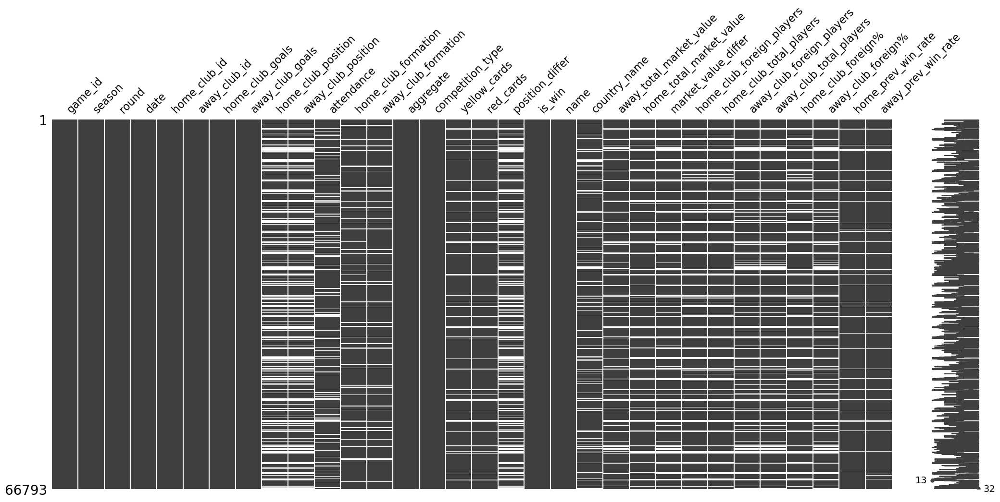

In [160]:
msno.matrix(df)
# position과 외국인 선수 비율은 손 좀 봐야할 것으로 보임

In [161]:
df.describe()

,game_id,season,home_club_id,away_club_id,home_club_goals,away_club_goals,home_club_position,away_club_position,attendance,yellow_cards,...,away_total_market_value,home_total_market_value,market_value_differ,home_club_foreign_players,home_club_total_players,away_club_foreign_players,away_club_total_players,home_club_foreign%,away_club_foreign%,away_prev_win_rate
count,6.679300e+04,66793.000000,66793.000000,66793.000000,66793.000000,66793.000000,46968.000000,46968.000000,57111.000000,60817.000000,...,5.791000e+04,5.676700e+04,5.407600e+04,53500.000000,53500.000000,54498.000000,54498.000000,53500.000000,54498.000000,62980.000000
mean,3.044598e+06,2017.388634,4889.840941,4411.354902,1.593969,1.321306,9.274911,9.459781,18179.268232,3.765296,...,8.173340e+07,8.330263e+07,8.628566e+05,7.426336,13.270093,7.354270,13.228302,0.559404,0.555624,0.561556
std,5.795043e+05,3.421820,11394.421779,10225.528409,1.425751,1.361183,5.301252,5.322275,17818.573969,2.420044,...,1.301663e+08,1.316315e+08,1.454293e+08,2.881163,1.766248,2.889221,1.804527,0.199890,0.200604,0.265990
min,2.211607e+06,2012.000000,1.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,...,1.000000e+04,1.000000e+04,-9.516000e+08,1.000000,1.000000,1.000000,1.000000,0.058824,0.058824,0.000000
25%,2.532379e+06,2014.000000,354.000000,347.000000,1.000000,0.000000,5.000000,5.000000,4363.000000,2.000000,...,9.725000e+06,9.975000e+06,-2.775000e+07,6.000000,13.000000,5.000000,13.000000,0.428571,0.428571,0.400000
50%,2.949855e+06,2017.000000,995.000000,987.000000,1.000000,1.000000,9.000000,9.000000,12260.000000,4.000000,...,3.070000e+07,3.180000e+07,2.500000e+04,7.000000,14.000000,7.000000,14.000000,0.571429,0.571429,0.600000
75%,3.490472e+06,2020.000000,3205.000000,3021.000000,2.000000,2.000000,14.000000,14.000000,26361.000000,5.000000,...,8.930000e+07,9.185000e+07,2.950000e+07,9.000000,14.000000,9.000000,14.000000,0.692308,0.692308,0.800000
max,4.280460e+06,2023.000000,112753.000000,112755.000000,15.000000,19.000000,21.000000,21.000000,99354.000000,16.000000,...,1.049000e+09,1.073000e+09,9.315000e+08,16.000000,17.000000,16.000000,19.000000,1.000000,1.000000,2.000000


In [162]:
df.describe(include="object")

,round,date,home_club_formation,away_club_formation,aggregate,competition_type,name,country_name,home_prev_win_rate
count,66793,66793,60427,60576,66793,66793,66793,58591,63251.0
unique,116,3486,75,76,113,4,42,14,11.0
top,First Round,2012-11-03,4-2-3-1,4-2-3-1,1:1,domestic_league,premier-liga,England,0.4
freq,2775,105,17716,17268,6678,46989,4899,6385,18030.0


In [127]:
def df_hist(df, list):
    fig,ax = plt.subplots(nrows = len(list), ncols=1 ,figsize=(100,500))
    for i in range(len(list)):
        sns.histplot(df, x=list[i], ax=ax[i], hue="is_win")
        plt.title(list[i], fontsize="100")

In [129]:
# 그래프 크기 및 제목 크기 조정에 대한 조언을 구합니다
df_hist(df, df.columns)

In [130]:
df.columns

Index(['game_id', 'season', 'round', 'date', 'home_club_id', 'away_club_id',
       'home_club_goals', 'away_club_goals', 'home_club_position',
       'away_club_position', 'attendance', 'home_club_formation',
       'away_club_formation', 'aggregate', 'competition_type', 'yellow_cards',
       'red_cards', 'position_differ', 'is_win', 'name', 'country_name',
       'away_total_market_value', 'home_total_market_value',
       'market_value_differ', 'home_club_foreign_players',
       'home_club_total_players', 'away_club_foreign_players',
       'away_club_total_players', 'home_club_foreign%', 'away_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate'],
      dtype='object')

<Axes: xlabel='attendance', ylabel='Count'>

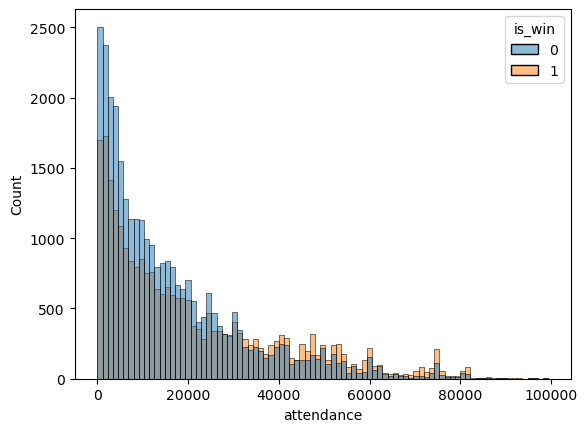

In [134]:
sns.histplot(df, x="attendance", hue="is_win")

<Axes: xlabel='yellow_cards', ylabel='Count'>

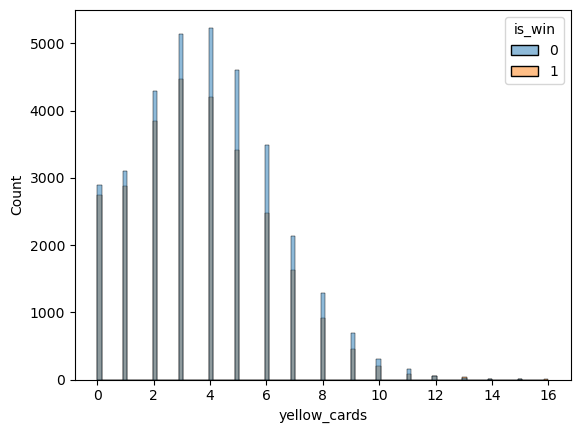

In [135]:
sns.histplot(df, x="yellow_cards", hue="is_win")

<Axes: xlabel='red_cards', ylabel='Count'>

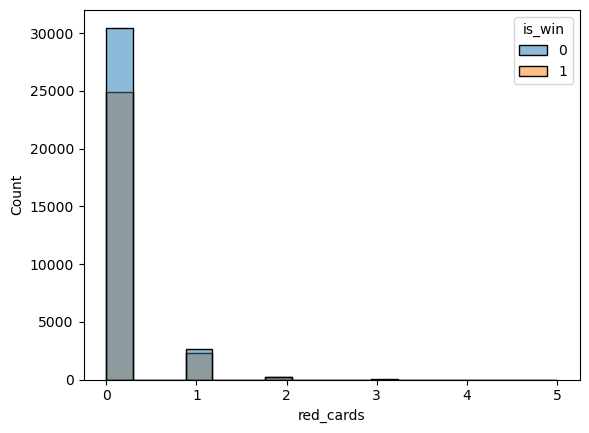

In [136]:
sns.histplot(df, x="red_cards", hue="is_win")

<Axes: xlabel='position_differ', ylabel='Count'>

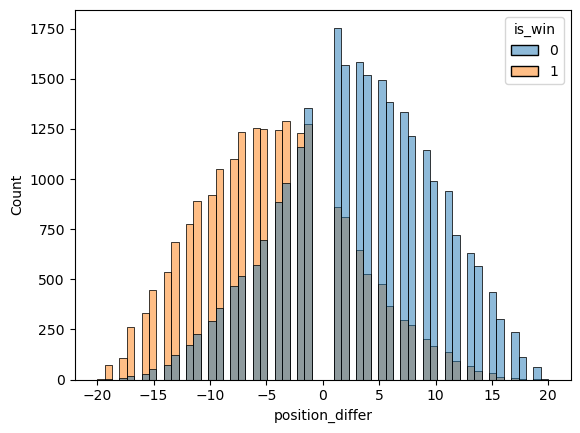

In [137]:
sns.histplot(df, x="position_differ", hue="is_win")

<Axes: xlabel='away_total_market_value', ylabel='Count'>

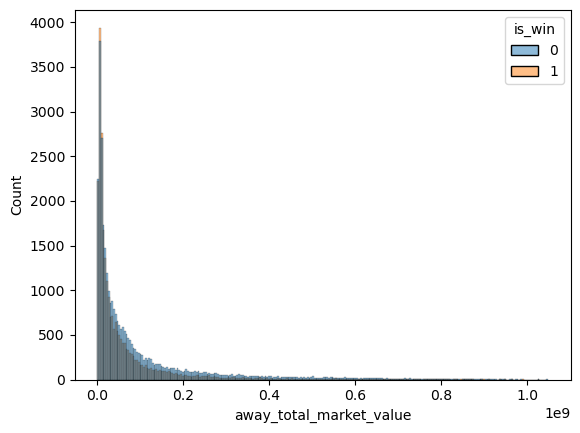

In [138]:
sns.histplot(df, x='away_total_market_value', hue="is_win")

<Axes: xlabel='home_total_market_value', ylabel='Count'>

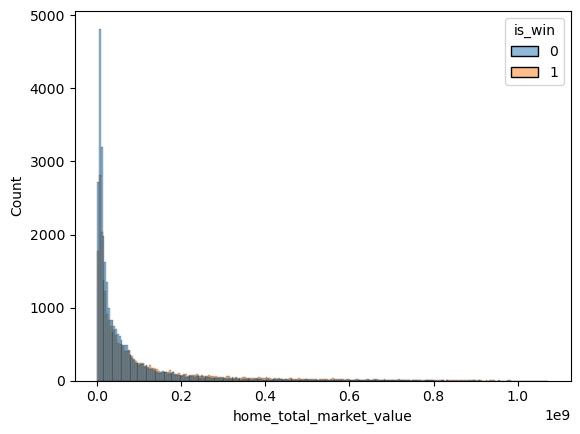

In [139]:
sns.histplot(df, x='home_total_market_value', hue="is_win")

<Axes: xlabel='market_value_differ', ylabel='Count'>

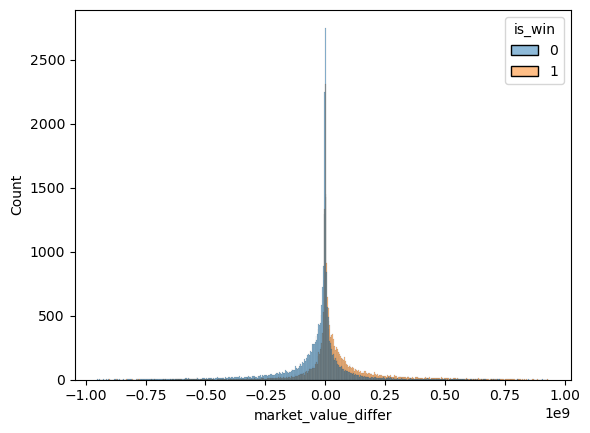

In [140]:
sns.histplot(df, x="market_value_differ", hue="is_win")

<Axes: xlabel='home_club_foreign%', ylabel='Count'>

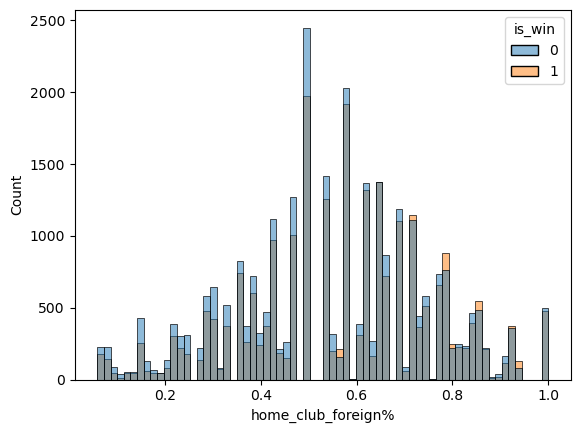

In [141]:
sns.histplot(df, x='home_club_foreign%', hue="is_win")

<Axes: xlabel='away_club_foreign%', ylabel='Count'>

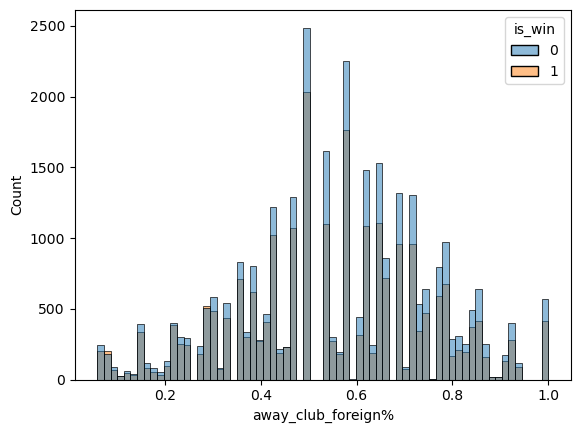

In [142]:
sns.histplot(df, x='away_club_foreign%', hue="is_win")

<Axes: xlabel='home_prev_win_rate', ylabel='Count'>

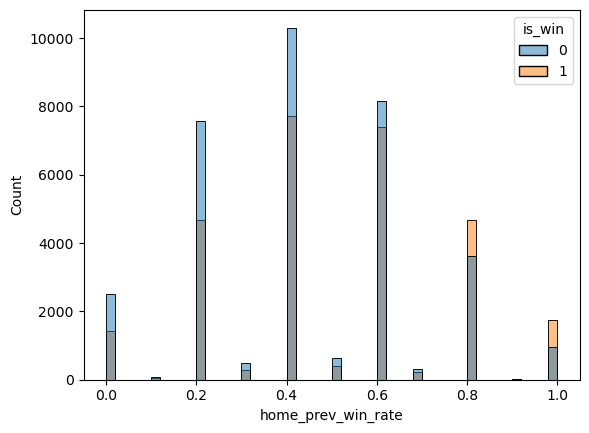

In [143]:
sns.histplot(df, x="home_prev_win_rate", hue="is_win")

<Axes: xlabel='away_prev_win_rate', ylabel='Count'>

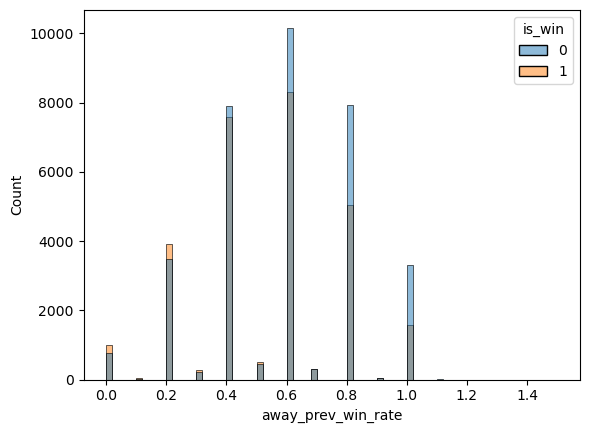

In [183]:
sns.histplot(df, x='away_prev_win_rate', hue="is_win")

In [182]:
df[df["away_prev_win_rate"] > 1]
# 이 5개는 왜 이렇게 나오는 지 이해가 안됨, 다른 행들은 문제가 없어 보인다.

,game_id,season,round,date,home_club_id,away_club_id,home_club_goals,away_club_goals,home_club_position,away_club_position,...,home_total_market_value,market_value_differ,home_club_foreign_players,home_club_total_players,away_club_foreign_players,away_club_total_players,home_club_foreign%,away_club_foreign%,home_prev_win_rate,away_prev_win_rate
1,2321060,2013,3. Matchday,2013-08-25,23,24,0,2,18.0,11.0,...,18050000.0,-37450000.0,6.0,13.0,3.0,11.0,0.461538,0.272727,0.3,1.1
2,2321086,2013,6. Matchday,2013-09-21,4,16,1,1,15.0,1.0,...,32800000.0,-151400000.0,8.0,12.0,5.0,14.0,0.666667,0.357143,0.2,1.1
3,2321152,2013,11. Matchday,2013-11-02,44,33,0,2,7.0,6.0,...,29050000.0,-90200000.0,9.0,14.0,8.0,13.0,0.642857,0.615385,0.8,1.5
6,2321307,2013,29. Matchday,2014-04-05,16,82,2,1,2.0,6.0,...,219600000.0,124100000.0,8.0,14.0,8.0,13.0,0.571429,0.615385,0.4,1.1
9,2323731,2013,1. Matchday,2013-07-17,16704,964,1,2,15.0,3.0,...,34050000.0,-79450000.0,7.0,14.0,6.0,14.0,0.500000,0.428571,0.6,1.1


In [188]:
df = df.drop([1,2,3,6,9])

<Axes: xlabel='away_prev_win_rate', ylabel='Count'>

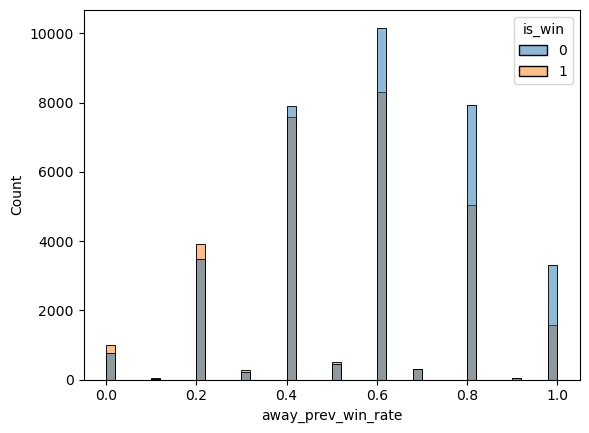

In [189]:
sns.histplot(df, x='away_prev_win_rate', hue="is_win")

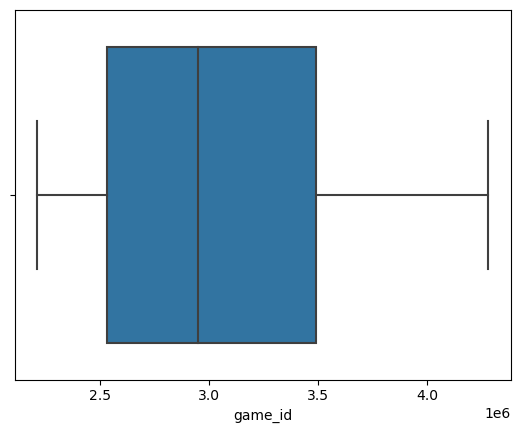

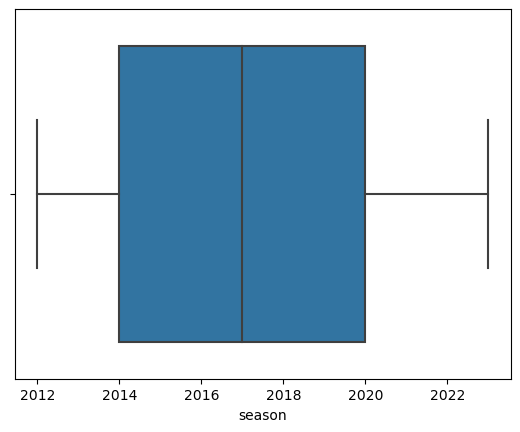

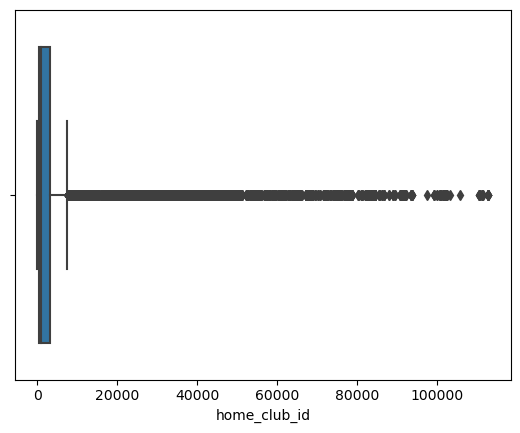

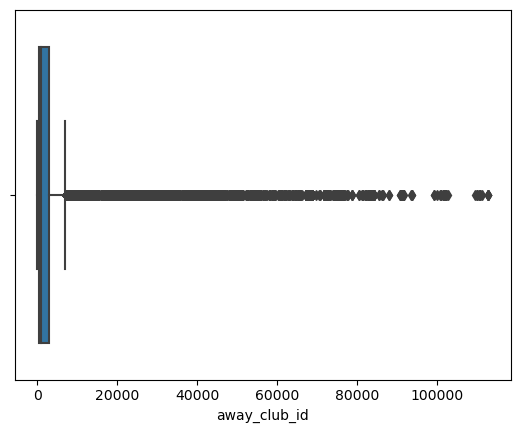

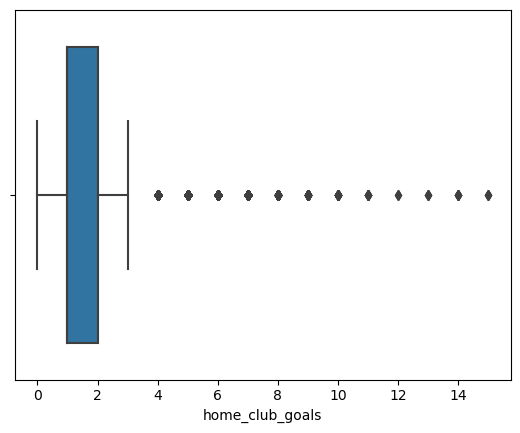

...

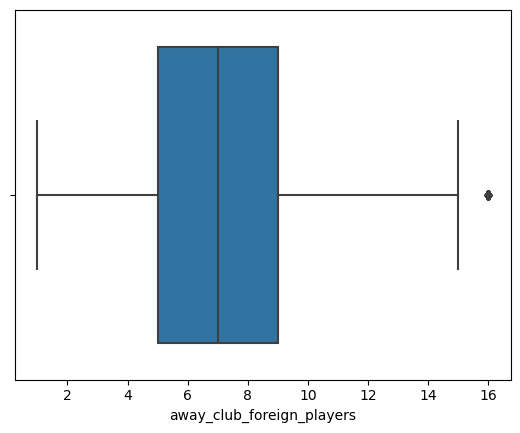

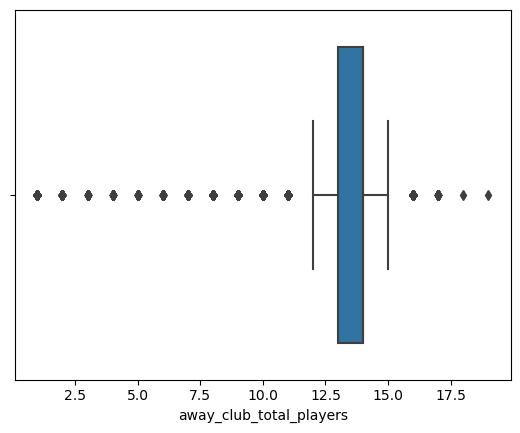

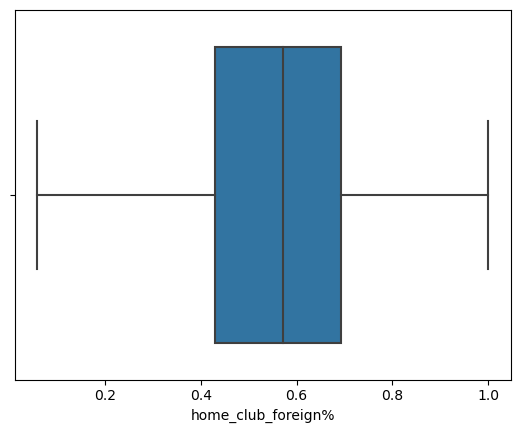

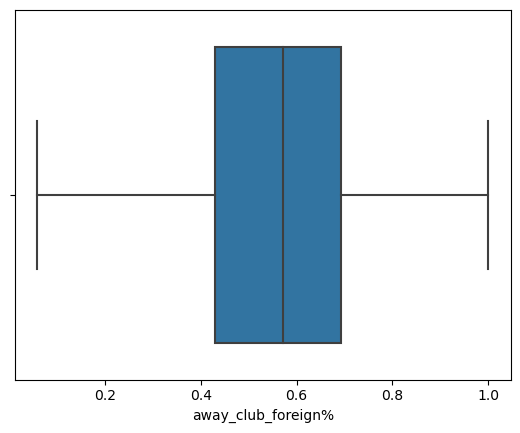

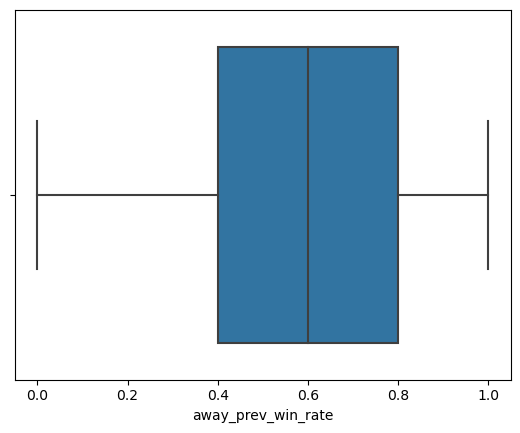

In [196]:
# 이상치 탐색
numeric_columns = df.select_dtypes(include='number').columns.tolist()

for i in range(len(numeric_columns)):
    sns.boxplot(df, x=numeric_columns[i], hue="is_win")
    plt.show()

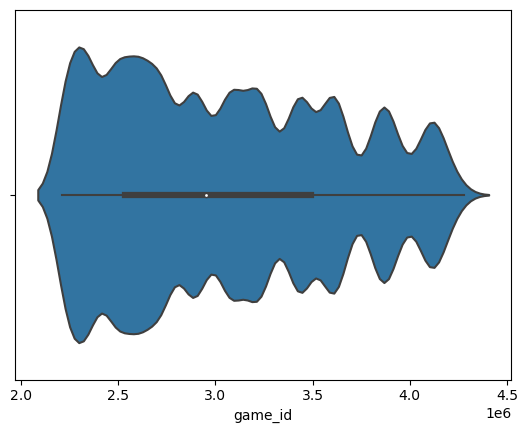

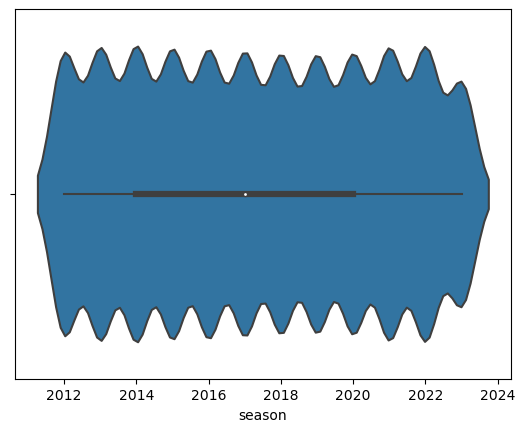

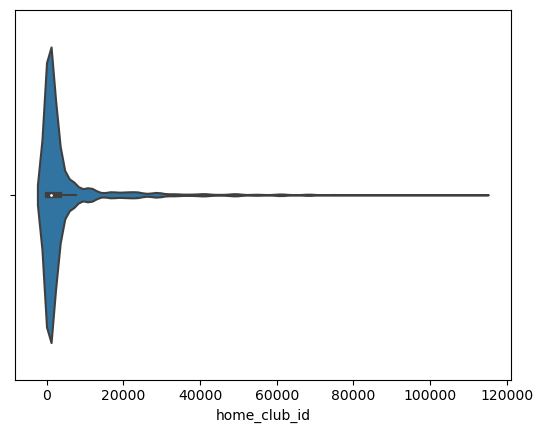

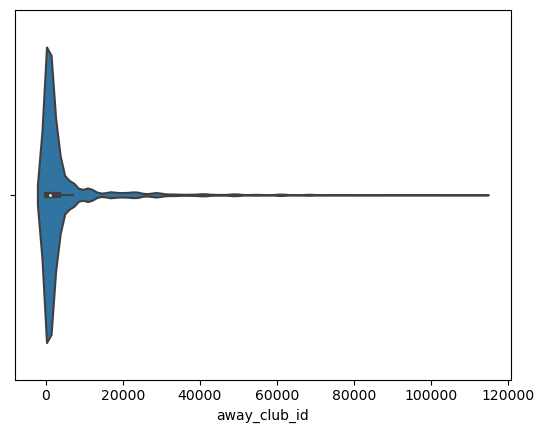

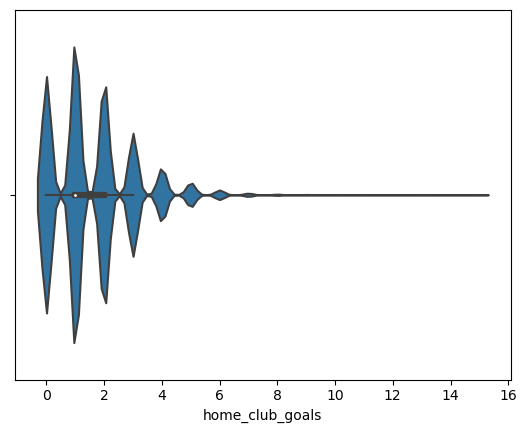

...

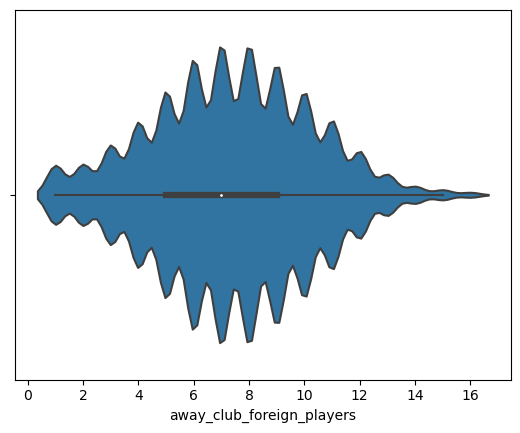

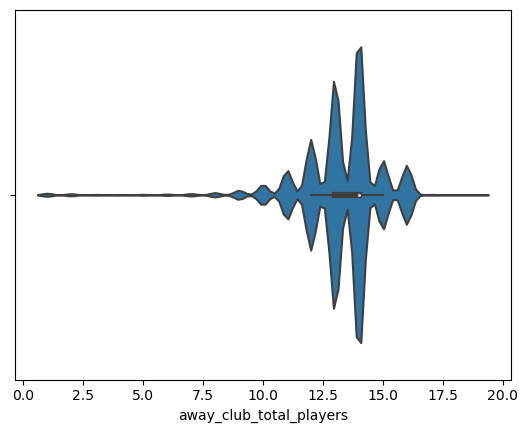

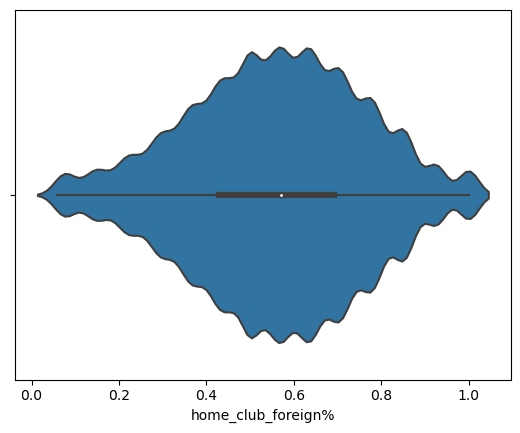

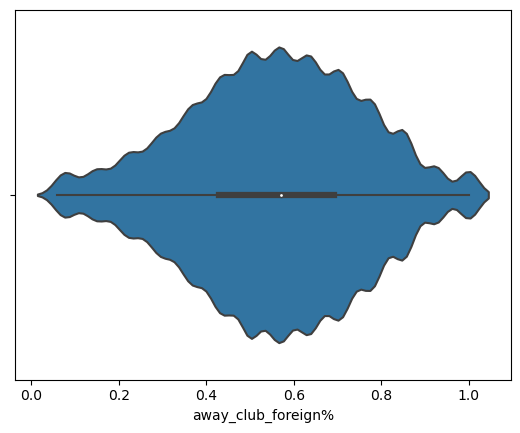

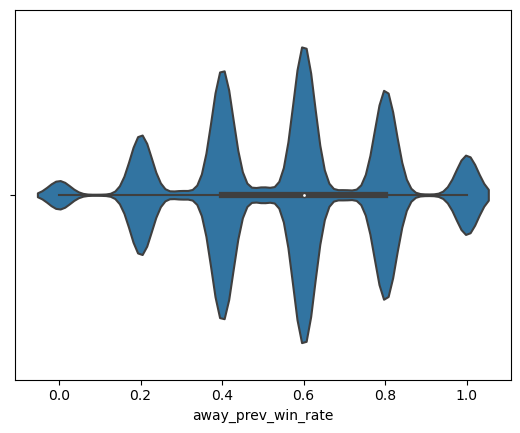

In [195]:
for i in range(len(numeric_columns)):
    sns.violinplot(df, x=numeric_columns[i], hue="is_win")
    plt.show()

/Users/yunkihun/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


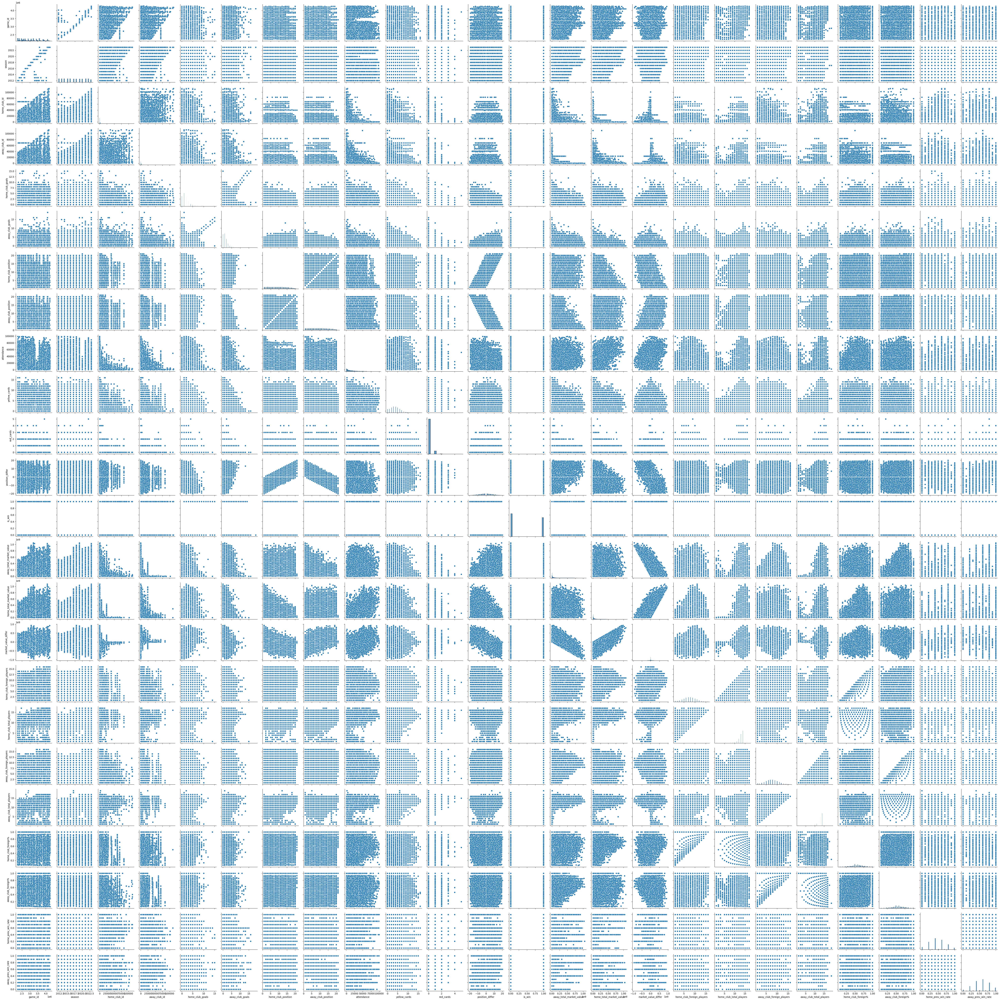

In [200]:
footballpairplot = sns.pairplot(df)

In [201]:
footballpairplot.savefig('pairplot.png')

In [240]:
def stepmatrics(df):
    corr_matrix = df.corr()
    mask = np.zeros_like(corr_matrix)
    mask[np.triu_indices_from(mask)] = True
    plt.figure(figsize=(100, 100))
    plt.rc('font', size=50, weight="bold")
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', mask=mask,  annot_kws={"size": 40})

In [230]:
df_int = df.loc[:, numeric_columns]
df_int = df_int.drop(columns=[
    'game_id', 'home_club_id', 'away_club_id', 'season'
])

In [241]:
 heatmap = stepmatrics(df_int)
# is_win의 상관관계가 일반적으로 너무 낮게 나오는데 0,1 밖에 없는 사실상의 명목형 변수라 그러한 것일 수도 있음

# 로지스틱 회귀분석

In [242]:
# 종속변수가 0,1로 이루어진 사실상의 명목형 변수이므로 연속형 변수를 독립변수로 지정하여 로지스틱 회귀분석을 시행해보자

# 독립변수를 확인하고 VIF를 체크해보자
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 66788 entries, 0 to 66792
Data columns (total 32 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   game_id                    66788 non-null  int64  
 1   season                     66788 non-null  int64  
 2   round                      66788 non-null  object 
 3   date                       66788 non-null  object 
 4   home_club_id               66788 non-null  int64  
 5   away_club_id               66788 non-null  int64  
 6   home_club_goals            66788 non-null  int64  
 7   away_club_goals            66788 non-null  int64  
 8   home_club_position         46963 non-null  float64
 9   away_club_position         46963 non-null  float64
 10  attendance                 57106 non-null  float64
 11  home_club_formation        60422 non-null  object 
 12  away_club_formation        60571 non-null  object 
 13  aggregate                  66788 non-null  object 


In [ ]:
# 독립변수로 삼기 위해 숫자형을 선정하고, id / season / round / date과 같은 값은 승부 예측에 무방하므로 제외
# goal 수는 이미 진행된 경기 수에 대한 결과이므로 생략
# 따라서 유의미한 변수는 home_club_position , away_club_formation , attendance , position_differ , away_total_market_value, home_total_market_value, market_value_differ, home_club_foreign% ,away_club_foreign% ,home_prev_win_rate ,away_prev_win_rate
# yellow, red는 큰 의미가 없을 것 같아서 생략

In [248]:
df["home_prev_win_rate"] = df["home_prev_win_rate"].astype("float64")

In [296]:
logistic_variance_list = ["home_club_position" , "away_club_position" , "attendance" , "position_differ" , "away_total_market_value", "home_total_market_value", "market_value_differ", "home_club_foreign%" ,"away_club_foreign%" ,"home_prev_win_rate" ,"away_prev_win_rate", "is_win"]

In [297]:
df_logistic = df.loc[:,logistic_variance_list]
df_vif_test = df_logistic.dropna()

In [257]:
# VIF 체크

def calculate_vif(X):
    # Create a DataFrame to store VIF values
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
    return vif_data

In [273]:
vif_scores = calculate_vif(df_vif_test)
print(vif_scores)

               Feature       VIF
0   home_club_position       inf
1   away_club_position       inf
2           attendance  2.814227
3      position_differ       inf
4  market_value_differ  1.523994
5   home_club_foreign%  9.905203
6   away_club_foreign%  9.779168
7   home_prev_win_rate  5.023515
8   away_prev_win_rate  5.754322


/Users/yunkihun/anaconda3/lib/python3.11/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


IF = 1: 다중공선성이 없습니다. 계수 추정치의 분산은 부풀려지지 않습니다. 이는 해당 기능이 데이터 세트의 다른 기능과 상관 관계가 없음을 나타냅니다.

VIF < 5: 약한 다중공선성. 계수 추정치의 분산은 적당히 부풀려져 데이터세트의 특성과 다른 특성 사이에 어느 정도 상관 관계가 있음을 나타냅니다. 이 수준의 다중 공선성은 일반적으로 허용됩니다.

VIF >= 5 및 < 10: 중간 다중 공선성. 계수 추정치의 분산이 크게 부풀려져 데이터 세트의 특징과 다른 특징 사이의 강한 상관 관계를 나타냅니다. 다중 공선성 문제를 조사하고 잠재적으로 해결하는 것을 고려하십시오.

VIF >= 10: 다중공선성이 심함. 계수 추정치의 분산이 크게 부풀려져 데이터세트의 특성과 다른 특성 사이에 매우 강한 상관관계가 있음을 나타냅니다. 다중 공선성은 모델 계수 및 예측의 불안정성을 유발할 가능성이 높으며 이를 해결해야 합니다.

INF는 무한대를 의미

===>
결과적으로 position은 differ을 제외하고 전부 생략해야할 것으로 보인다.
market_value_differ도 마찬가지

In [298]:
# 다중 공선성이 높은 항목을 지우고 다시 VIF를 체크해보자
df_vif_test = df_vif_test.drop(columns=["away_total_market_value", "home_total_market_value","home_club_position", "away_club_position"])

In [275]:
vif_scores = calculate_vif(df_vif_test)
print(vif_scores)

#외국인 비율은 어째야할지 고민인데.. 일단 10이하니까 넘어가보자

               Feature       VIF
0           attendance  2.808850
1      position_differ  1.743324
2  market_value_differ  1.523836
3   home_club_foreign%  8.874072
4   away_club_foreign%  8.805503
5   home_prev_win_rate  5.013977
6   away_prev_win_rate  5.723391


In [301]:
df_vif_test.shape

(40099, 8)

In [304]:
X = df_vif_test.drop(columns="is_win")
y = df_vif_test["is_win"]

In [305]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [306]:
model = LogisticRegression()

In [307]:
model.fit(X_train, y_train)

LogisticRegression()

In [308]:
y_pred = model.predict(X_test)

In [309]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.6480049875311721


In [310]:
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020



In [311]:
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Confusion Matrix:
[[2740 1563]
 [1260 2457]]


In [312]:
# Get the coefficients (weights) of the logistic regression model
coefficients = model.coef_

# Get the intercept of the logistic regression model
intercept = model.intercept_

# Print coefficients and intercept
print("Coefficients:", coefficients)
print("Intercept:", intercept)

#intercept는 절편

Coefficients: [[-1.16622181e-12 -3.61008342e-15  5.08473560e-09 -7.09384841e-17
  -7.88157521e-17 -3.31959997e-17 -9.64721880e-17]]
Intercept: [-1.3617407e-16]


In [315]:
df_vif_test.columns

Index(['attendance', 'position_differ', 'market_value_differ',
       'home_club_foreign%', 'away_club_foreign%', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')

In [322]:
# 변수를 조금 조정해보자

def logistic(df):
    
    X = df.drop(columns="is_win")
    y = df["is_win"]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = LogisticRegression()

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    
    print(df.columns)

    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy)

    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

    coefficients = model.coef_

    intercept = model.intercept_

    print("Coefficients:", coefficients)
    print("Intercept:", intercept)

    print("-" * 100)

In [325]:
df_for_combination = df_vif_test.drop(columns="is_win")
variable_names = df_vif_test.columns.tolist()

In [339]:
for i in range(1, 8):
    for combination in itertools.combinations(variable_names, i):
        # Extract the subset of variables for the current combination
        X_subset = df_vif_test[list(combination)]
        X_subset["is_win"] = df_vif_test["is_win"]
        
        logistic(X_subset)

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'is_win'], dtype='object')
Accuracy: 0.7228179551122195
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.77      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3312  991]
 [1232 2485]]
Coefficients: [[ 3.24810245e-06 -1.58563958e-01]]
Intercept: [-0.36409414]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control t

Index(['attendance', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.46346633416458854
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4303
           1       0.46      1.00      0.63      3717

    accuracy                           0.46      8020
   macro avg       0.23      0.50      0.32      8020
weighted avg       0.21      0.46      0.29      8020

Confusion Matrix:
[[   0 4303]
 [   0 3717]]
Coefficients: [[ 1.48344444e-06 -1.83843775e-09]]
Intercept: [-2.24004648e-09]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'is_win'], dtype='object')
Accuracy: 0.46346633416458854
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4303
           1       0.46      1.00      0.63      3717

    accuracy                           0.46      8020
   mac

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'away_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.7211970074812968
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.75      0.74      4303
           1       0.70      0.69      0.70      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3230 1073]
 [1163 2554]]
Coefficients: [[-0.16052687  0.07481614]]
Intercept: [-0.34313806]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'home_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.7216957605985037
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.7

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

              precision    recall  f1-score   support

           0       0.74      0.76      0.75      4303
           1       0.71      0.69      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.73      0.73      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3277 1026]
 [1150 2567]]
Coefficients: [[-0.16688676  0.55510801]]
Intercept: [-0.60765509]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'is_win'], dtype='object')
Accuracy: 0.7218204488778055
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.75      0.74      4303
           1       0.70      0.69      0.70      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3206 109

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['market_value_differ', 'away_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[ 5.08474260e-09 -7.87897158e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['market_value_differ', 'home_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy          

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['home_club_foreign%', 'away_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.5391521197007482
Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.90      0.68      4303
           1       0.51      0.13      0.20      3717

    accuracy                           0.54      8020
   macro avg       0.53      0.51      0.44      8020
weighted avg       0.53      0.54      0.46      8020

Confusion Matrix:
[[3855  448]
 [3248  469]]
Coefficients: [[ 0.77880546 -0.74043538]]
Intercept: [-0.22568121]
----------------------------------------------------------------------------------------------------
Index(['home_club_foreign%', 'home_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.5759351620947631
Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4303
           1       0.58      0.33      0.42      3717

    accuracy                        

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['away_club_foreign%', 'home_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.5758104738154614
Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4303
           1       0.57      0.34      0.42      3717

    accuracy                           0.58      8020
   macro avg       0.57      0.56      0.54      8020
weighted avg       0.57      0.58      0.55      8020

Confusion Matrix:
[[3361  942]
 [2460 1257]]
Coefficients: [[-0.49459507  1.27528355]]
Intercept: [-0.51401324]
----------------------------------------------------------------------------------------------------
Index(['away_club_foreign%', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.5516209476309227
Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.81      0.66      4303
           1       0.53      0.26      0.35      3717

    accuracy                        

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

              precision    recall  f1-score   support

           0       0.57      0.87      0.69      4303
           1       0.61      0.23      0.33      3717

    accuracy                           0.57      8020
   macro avg       0.59      0.55      0.51      8020
weighted avg       0.59      0.57      0.52      8020

Confusion Matrix:
[[3754  549]
 [2864  853]]
Coefficients: [[1.26982157]]
Intercept: [-0.78437445]
----------------------------------------------------------------------------------------------------
Index(['away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.550498753117207
Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.86      0.67      4303
           1       0.54      0.19      0.29      3717

    accuracy                           0.55      8020
   macro avg       0.55      0.53      0.48      8020
weighted avg       0.55      0.55      0.49      8020

Confusion Matrix:
[[3693  610]
 [2995  

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'home_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.722568578553616
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3290 1013]
 [1212 2505]]
Coefficients: [[ 3.48450190e-06 -1.58808068e-01 -1.48434091e-01]]
Intercept: [-0.28552489]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'away_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.7216957605985037
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'home_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.7236907730673316
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.68      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3281 1022]
 [1194 2523]]
Coefficients: [[ 5.35283572e-06 -1.65139984e-01 -5.68193211e-01]]
Intercept: [-0.1499243]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.7273067331670823
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'is_win'], dtype='object')
Accuracy: 0.7228179551122195
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.77      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3312  991]
 [1232 2485]]
Coefficients: [[ 3.24810245e-06 -1.58563958e-01]]
Intercept: [-0.36409414]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'home_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy            

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'market_value_differ', 'home_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622180e-12  5.08473560e-09 -3.31959996e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66 

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being se

Index(['attendance', 'home_club_foreign%', 'home_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.46346633416458854
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4303
           1       0.46      1.00      0.63      3717

    accuracy                           0.46      8020
   macro avg       0.23      0.50      0.32      8020
weighted avg       0.21      0.46      0.29      8020

Confusion Matrix:
[[   0 4303]
 [   0 3717]]
Coefficients: [[ 1.48344141e-06 -1.05255935e-09 -2.73589613e-10]]
Intercept: [-2.24001992e-09]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'home_club_foreign%', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.46346633416458854
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4303
           1       0.46      1.00

/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control t

Index(['attendance', 'away_club_foreign%', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.46346633416458854
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4303
           1       0.46      1.00      0.63      3717

    accuracy                           0.46      8020
   macro avg       0.23      0.50      0.32      8020
weighted avg       0.21      0.46      0.29      8020

Confusion Matrix:
[[   0 4303]
 [   0 3717]]
Coefficients: [[ 1.48344732e-06 -1.42128980e-09 -1.83845817e-09]]
Intercept: [-2.24007149e-09]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'away_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.46346633416458854
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4303
           1       0.46      1.00      0.63      3717



/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

Index(['position_differ', 'market_value_differ', 'home_club_foreign%',
       'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2738 1565]
 [1260 2457]]
Coefficients: [[-3.60893112e-15  5.08474260e-09 -7.09144453e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'market_value_differ', 'away_club_foreign%',
       'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.64      0.66      43

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'market_value_differ', 'is_win'], dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2738 1565]
 [1260 2457]]
Coefficients: [[-3.60893112e-15  5.08474260e-09]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'home_club_foreign%', 'away_club_foreign%',
       'is_win'],
      dtype='object')
Accuracy: 0.7219451371571073
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.75      0.74      4303
           1       0.71      0.69      0.70      

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['position_differ', 'home_club_foreign%', 'home_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.7218204488778055
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3283 1020]
 [1211 2506]]
Coefficients: [[-0.16642482  0.04426612 -0.46418855]]
Intercept: [-0.11805262]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'home_club_foreign%', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.7278054862842893
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'home_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.7218204488778055
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.75      0.74      4303
           1       0.70      0.69      0.70      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3206 1097]
 [1134 2583]]
Coefficients: [[-0.16031593  0.00147211]]
Intercept: [-0.30281574]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'away_club_foreign%', 'home_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.7231920199501247
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.68      0.69      3717

    acc

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'home_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.7216957605985037
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3282 1021]
 [1211 2506]]
Coefficients: [[-0.1665007  -0.46130859]]
Intercept: [-0.09497783]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.7286783042394015
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.76      0.75      4303
           1       0.71      0.69      0.70      3717

    accuracy                           0.7

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[ 5.08474260e-09 -7.09144451e-17 -3.31840761e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['market_value_differ', 'home_club_foreign%', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65     

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['market_value_differ', 'away_club_foreign%', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[ 5.08474260e-09 -7.87897158e-17 -9.64406336e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['market_value_differ', 'away_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[ 5.08474260e-09 -3.31840761e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['market_value_differ', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65  

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['home_club_foreign%', 'away_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.5391521197007482
Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.90      0.68      4303
           1       0.51      0.13      0.20      3717

    accuracy                           0.54      8020
   macro avg       0.53      0.51      0.44      8020
weighted avg       0.53      0.54      0.46      8020

Confusion Matrix:
[[3855  448]
 [3248  469]]
Coefficients: [[ 0.77880546 -0.74043538]]
Intercept: [-0.22568121]
----------------------------------------------------------------------------------------------------
Index(['home_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.5901496259351621
Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.77      0.67      4303
           1       0.59      0.38      0.46      3717

 

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['home_club_foreign%', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.5529925187032418
Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4303
           1       0.53      0.27      0.36      3717

    accuracy                           0.55      8020
   macro avg       0.55      0.53      0.51      8020
weighted avg       0.55      0.55      0.52      8020

Confusion Matrix:
[[3425  878]
 [2707 1010]]
Coefficients: [[ 0.5241629  -1.04686875]]
Intercept: [0.07700852]
----------------------------------------------------------------------------------------------------
Index(['away_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.5905236907730673
Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.77      0.67      4303
           1       0.59      0.38      0.47      3717

  

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['home_prev_win_rate', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.5867830423940149
Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4303
           1       0.59      0.37      0.45      3717

    accuracy                           0.59      8020
   macro avg       0.59      0.57      0.56      8020
weighted avg       0.59      0.59      0.57      8020

Confusion Matrix:
[[3346  957]
 [2357 1360]]
Coefficients: [[ 1.2981174  -1.08145513]]
Intercept: [-0.20863686]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'market_value_differ',
       'home_club_foreign%', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64 

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'position_differ', 'market_value_differ',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622181e-12 -3.61008342e-15  5.08473560e-09 -9.64721880e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'market_value_differ', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3281 1022]
 [1209 2508]]
Coefficients: [[ 3.45004491e-06 -1.58397035e-01 -1.20611092e-01 -1.19175147e-01]]
Intercept: [-0.23215641]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'home_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7233167082294264
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.68      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'home_club_foreign%',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7203241895261845
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.74      4303
           1       0.71      0.68      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3265 1038]
 [1205 2512]]
Coefficients: [[ 3.15068221e-06 -1.57848242e-01 -1.24692147e-01 -8.22670336e-02]]
Intercept: [-0.23987485]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'home_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.722568578553616
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'away_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7218204488778055
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3290 1013]
 [1218 2499]]
Coefficients: [[ 4.34273957e-06 -1.59586735e-01 -1.31161461e-01 -1.41082332e-01]]
Intercept: [-0.25550647]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'away_club_foreign%',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7265586034912718
Classification Report:
              precision    recall  f1-score   support

           0 

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.728927680798005
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.73      0.73      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3315  988]
 [1186 2531]]
Coefficients: [[ 4.48556226e-06 -1.74616492e-01 -6.94945730e-01  6.17947671e-01]]
Intercept: [-0.41534289]
----------------------------------------------------------------------------------------------------


/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'home_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.7236907730673316
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.68      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3281 1022]
 [1194 2523]]
Coefficients: [[ 5.35283572e-06 -1.65139984e-01 -5.68193211e-01]]
Intercept: [-0.1499243]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.7273067331670823
Classification Report:


/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.72      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3294 1009]
 [1178 2539]]
Coefficients: [[ 1.40560999e-06 -1.53954209e-01  3.46866675e-01]]
Intercept: [-0.48240621]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'home_club_foreign%',
       'away_club_foreign%', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65     

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.1662218e-12  5.0847356e-09 -7.0938484e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'away_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'market_value_differ', 'away_club_foreign%', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622180e-12  5.08473560e-09 -7.88157519e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'market_value_differ', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622180e-12  5.08473560e-09 -9.64721878e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'home_club_foreign%', 'away_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.46346633416458854
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4303

/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/var/folders/ld/bjk

Index(['attendance', 'home_club_foreign%', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.46346633416458854
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4303
           1       0.46      1.00      0.63      3717

    accuracy                           0.46      8020
   macro avg       0.23      0.50      0.32      8020
weighted avg       0.21      0.46      0.29      8020

Confusion Matrix:
[[   0 4303]
 [   0 3717]]
Coefficients: [[ 1.48344605e-06 -1.05257843e-09 -1.83844910e-09]]
Intercept: [-2.24006038e-09]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'away_club_foreign%', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.46346633416458854
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      430

/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

Index(['position_differ', 'market_value_differ', 'home_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2738 1565]
 [1260 2457]]
Coefficients: [[-3.60893112e-15  5.08474260e-09 -7.09144453e-17 -3.31840762e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'market_value_differ', 'home_club_foreign%',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'market_value_differ', 'away_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2738 1565]
 [1260 2457]]
Coefficients: [[-3.60893112e-15  5.08474260e-09 -7.87897159e-17 -3.31840762e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'market_value_differ', 'away_club_foreign%',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'market_value_differ', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2738 1565]
 [1260 2457]]
Coefficients: [[-3.60893112e-15  5.08474260e-09 -3.31840762e-17 -9.64406338e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'market_value_differ', 'home_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0 

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'home_club_foreign%', 'away_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7231920199501247
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.68      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3278 1025]
 [1195 2522]]
Coefficients: [[-0.16683593  0.00813452  0.1050061  -0.4664005 ]]
Intercept: [-0.15494799]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'home_club_foreign%', 'away_club_foreign%',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7273067331670823
Classification Report:
              precision    recall  f1-score   support

           0 

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


              precision    recall  f1-score   support

           0       0.74      0.75      0.74      4303
           1       0.71      0.69      0.70      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3236 1067]
 [1163 2554]]
Coefficients: [[-0.16062833 -0.02969898  0.08542225]]
Intercept: [-0.33265058]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'home_club_foreign%', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7281795511221946
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.73   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


[[3283 1020]
 [1211 2506]]
Coefficients: [[-0.16642482  0.04426612 -0.46418855]]
Intercept: [-0.11805262]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'home_club_foreign%', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.7278054862842893
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.73      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3293 1010]
 [1173 2544]]
Coefficients: [[-0.16695633 -0.02324102  0.55585215]]
Intercept: [-0.5952731]
----------------------------------------------------------------------------------------------------


/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['position_differ', 'away_club_foreign%', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.727930174563591
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.73      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3313  990]
 [1192 2525]]
Coefficients: [[-0.1764411   0.07761608 -0.59144342  0.66613246]]
Intercept: [-0.44602073]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'away_club_foreign%', 'home_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.7231920199501247
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'away_club_foreign%', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.7271820448877806
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.72      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3293 1010]
 [1178 2539]]
Coefficients: [[-0.16698146  0.04249867  0.55333779]]
Intercept: [-0.63007957]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.727930174563591
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.77      0.75      4303
           1    

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['market_value_differ', 'home_club_foreign%', 'away_club_foreign%',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[ 5.08474260e-09 -7.09144451e-17 -7.87897158e-17 -9.64406336e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['market_value_differ', 'home_club_foreign%', 'away_club_foreign%',
       'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

       

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['market_value_differ', 'away_club_foreign%', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[ 5.08474260e-09 -7.87897158e-17 -9.64406336e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['market_value_differ', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66  

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

[[3375  928]
 [2461 1256]]
Coefficients: [[ 0.61445876 -0.7056752   1.22979841]]
Intercept: [-0.71755573]
----------------------------------------------------------------------------------------------------
Index(['home_club_foreign%', 'away_club_foreign%', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.556359102244389
Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4303
           1       0.54      0.29      0.38      3717

    accuracy                           0.56      8020
   macro avg       0.55      0.54      0.52      8020
weighted avg       0.55      0.56      0.53      8020

Confusion Matrix:
[[3370  933]
 [2625 1092]]
Coefficients: [[ 0.74243001 -0.62753496 -1.00679773]]
Intercept: [0.28023355]
----------------------------------------------------------------------------------------------------
Index(['home_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
     

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

              precision    recall  f1-score   support

           0       0.59      0.77      0.67      4303
           1       0.59      0.38      0.47      3717

    accuracy                           0.59      8020
   macro avg       0.59      0.58      0.57      8020
weighted avg       0.59      0.59      0.57      8020

Confusion Matrix:
[[3305  998]
 [2286 1431]]
Coefficients: [[-0.38960421  1.30169194 -1.05625603]]
Intercept: [-0.00906436]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'market_value_differ',
       'home_club_foreign%', 'away_club_foreign%', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'position_differ', 'market_value_differ',
       'home_club_foreign%', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622181e-12 -3.61008342e-15  5.08473560e-09 -7.09384841e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'market_value_differ',
       'away_club_foreign%', 'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-sco

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622181e-12 -3.61008342e-15  5.08473560e-09 -7.88157521e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'market_value_differ',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020


/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'home_club_foreign%',
       'away_club_foreign%', 'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7224438902743142
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3288 1015]
 [1211 2506]]
Coefficients: [[ 4.35819131e-06 -1.59604692e-01 -1.11412683e-01 -1.10152685e-01
  -1.18214620e-01]]
Intercept: [-0.21448554]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'home_club_foreign%',
       'away_club_foreign%', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7205735660847881
Classification Report:
      

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'home_club_foreign%',
       'away_club_foreign%', 'is_win'],
      dtype='object')
Accuracy: 0.7218204488778055
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3281 1022]
 [1209 2508]]
Coefficients: [[ 3.45004491e-06 -1.58397035e-01 -1.20611092e-01 -1.19175147e-01]]
Intercept: [-0.23215641]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'home_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.722069825436409
Classification Report:
              precision    recall  f1-score   s

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'home_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7233167082294264
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.68      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3279 1024]
 [1195 2522]]
Coefficients: [[ 5.36463440e-06 -1.65033953e-01 -1.25221056e-02 -5.62348962e-01]]
Intercept: [-0.14588674]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'home_club_foreign%',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7203241895261845
Classification Report:
              precision    recall  f1-score   support

           0 

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'away_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.721072319201995
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3275 1028]
 [1209 2508]]
Coefficients: [[ 3.95250581e-06 -1.58591997e-01 -1.12498871e-01 -1.20831328e-01
  -7.52511540e-02]]
Intercept: [-0.21903042]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'away_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7218204488778055
Classification Report:
              precision    re

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'away_club_foreign%',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7265586034912718
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.72      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3311  992]
 [1201 2516]]
Coefficients: [[ 2.24487266e-06 -1.64965785e-01 -1.41962220e-01  5.31662343e-01]]
Intercept: [-0.55726932]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')


/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Accuracy: 0.728927680798005
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.73      0.73      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3315  988]
 [1186 2531]]
Coefficients: [[ 4.48556226e-06 -1.74616492e-01 -6.94945730e-01  6.17947671e-01]]
Intercept: [-0.41534289]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'home_club_foreign%',
       'away_club_foreign%', 'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

   

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622180e-12  5.08473560e-09 -7.09384840e-17 -7.88157519e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'home_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      80

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'market_value_differ', 'away_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622180e-12  5.08473560e-09 -7.88157519e-17 -3.31959996e-17
  -9.64721878e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'away_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              pre

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'market_value_differ', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622180e-12  5.08473560e-09 -3.31959996e-17 -9.64721878e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'home_club_foreign%', 'away_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.46346633416458854
Classification Report:
              precision    recall  

/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4303
           1       0.46      1.00      0.63      3717

    accuracy                           0.46      8020
   macro avg       0.23      0.50      0.32      8020
weighted avg       0.21      0.46      0.29      8020

Confusion Matrix:
[[   0 4303]
 [   0 3717]]
Coefficients: [[ 1.48344744e-06 -1.42129047e-09 -2.73596360e-10 -1.83845903e-09]]
Intercept: [-2.24007254e-09]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'market_value_differ', 'home_club_foreign%',
       'away_club_foreign%', 'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65  

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'market_value_differ', 'home_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2738 1565]
 [1260 2457]]
Coefficients: [[-3.60893112e-15  5.08474260e-09 -7.09144453e-17 -3.31840762e-17
  -9.64406338e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'market_value_differ', 'home_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
      

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2738 1565]
 [1260 2457]]
Coefficients: [[-3.60893112e-15  5.08474260e-09 -7.87897159e-17 -3.31840762e-17
  -9.64406338e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'market_value_differ', 'away_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65      

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'home_club_foreign%', 'away_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.727930174563591
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.73      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3313  990]
 [1192 2525]]
Coefficients: [[-0.17644704 -0.00199804  0.07824368 -0.59134771  0.66615997]]
Intercept: [-0.4453247]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'home_club_foreign%', 'away_club_foreign%',
       'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7231920199501247
Classification Report:
              precision    recall  f

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.72      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3306  997]
 [1190 2527]]
Coefficients: [[-0.16714342 -0.04295329  0.05716665  0.55415046]]
Intercept: [-0.61496172]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'home_club_foreign%', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7281795511221946
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72 

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['position_differ', 'away_club_foreign%', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.727930174563591
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.73      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3313  990]
 [1192 2525]]
Coefficients: [[-0.1764411   0.07761608 -0.59144342  0.66613246]]
Intercept: [-0.44602073]
----------------------------------------------------------------------------------------------------
Index(['market_value_differ', 'home_club_foreign%', 'away_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['market_value_differ', 'home_club_foreign%', 'away_club_foreign%',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[ 5.08474260e-09 -7.09144451e-17 -7.87897158e-17 -9.64406336e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['market_value_differ', 'home_club_foreign%', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-sc

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'position_differ', 'market_value_differ',
       'home_club_foreign%', 'away_club_foreign%', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622181e-12 -3.61008342e-15  5.08473560e-09 -7.09384841e-17
  -7.88157521e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'market_value_differ',
       'home_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.648004987531

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622181e-12 -3.61008342e-15  5.08473560e-09 -7.09384841e-17
  -9.64721880e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'market_value_differ',
       'away_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    acc

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'position_differ', 'market_value_differ',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622181e-12 -3.61008342e-15  5.08473560e-09 -3.31959997e-17
  -9.64721880e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'home_club_foreign%',
       'away_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.7271820448877

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'home_club_foreign%',
       'away_club_foreign%', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7205735660847881
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.74      4303
           1       0.71      0.68      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3265 1038]
 [1203 2514]]
Coefficients: [[ 3.18767805e-06 -1.57640912e-01 -1.04518601e-01 -1.03350223e-01
  -6.92179482e-02]]
Intercept: [-0.20121502]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'home_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.722069825436409
Classification Report:
       

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'away_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.721072319201995
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      4303
           1       0.71      0.67      0.69      3717

    accuracy                           0.72      8020
   macro avg       0.72      0.72      0.72      8020
weighted avg       0.72      0.72      0.72      8020

Confusion Matrix:
[[3275 1028]
 [1209 2508]]
Coefficients: [[ 3.95250581e-06 -1.58591997e-01 -1.12498871e-01 -1.20831328e-01
  -7.52511540e-02]]
Intercept: [-0.21903042]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'home_club_foreign%',
       'away_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.64800498753117

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'market_value_differ', 'home_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622180e-12  5.08473560e-09 -7.09384840e-17 -3.31959996e-17
  -9.64721878e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'away_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Rep

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/Users/yunkihun/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being se

Index(['position_differ', 'market_value_differ', 'home_club_foreign%',
       'away_club_foreign%', 'home_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2738 1565]
 [1260 2457]]
Coefficients: [[-3.60893112e-15  5.08474260e-09 -7.09144453e-17 -7.87897159e-17
  -3.31840762e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'market_value_differ', 'home_club_foreign%',
       'away_club_foreign%', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6477556109725686
Classif

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4303
           1       0.61      0.66      0.63      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2738 1565]
 [1260 2457]]
Coefficients: [[-3.60893112e-15  5.08474260e-09 -7.87897159e-17 -3.31840762e-17
  -9.64406338e-17]]
Intercept: [-1.36128547e-16]
----------------------------------------------------------------------------------------------------
Index(['position_differ', 'home_club_foreign%', 'away_club_foreign%',
       'home_prev_win_rate', 'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.727930174563591
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                 

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'market_value_differ',
       'home_club_foreign%', 'away_club_foreign%', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622181e-12 -3.61008342e-15  5.08473560e-09 -7.09384841e-17
  -7.88157521e-17 -3.31959997e-17 -9.64721880e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'market_value_differ',
       'home_club_foreign%', 'away_club_foreign%', 'ho

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Index(['attendance', 'position_differ', 'market_value_differ',
       'home_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.6480049875311721
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.64      0.66      4303
           1       0.61      0.66      0.64      3717

    accuracy                           0.65      8020
   macro avg       0.65      0.65      0.65      8020
weighted avg       0.65      0.65      0.65      8020

Confusion Matrix:
[[2740 1563]
 [1260 2457]]
Coefficients: [[-1.16622181e-12 -3.61008342e-15  5.08473560e-09 -7.09384841e-17
  -3.31959997e-17 -9.64721880e-17]]
Intercept: [-1.3617407e-16]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'position_differ', 'market_value_differ',
       'away_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
 

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['attendance', 'position_differ', 'home_club_foreign%',
       'away_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
      dtype='object')
Accuracy: 0.7271820448877806
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.72      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3305  998]
 [1190 2527]]
Coefficients: [[ 4.68353203e-06 -1.74767173e-01 -1.08617195e-01 -2.41246295e-02
  -7.02045892e-01  6.15216522e-01]]
Intercept: [-0.33966386]
----------------------------------------------------------------------------------------------------
Index(['attendance', 'market_value_differ', 'home_club_foreign%',
       'away_club_foreign%', 'home_prev_win_rate', 'away_prev_win_rate',
       'is_win'],
  

/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]
/var/folders/ld/bjk749657q3gc2fpmc3lht4m0000gn/T/ipykernel_24596/2469928203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_subset["is_win"] = df_vif_test["is_win"]


Index(['position_differ', 'away_prev_win_rate', 'is_win'], dtype='object')
Accuracy: 0.7286783042394015
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.76      0.75      4303
           1       0.71      0.69      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.73      0.73      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3277 1026]
 [1150 2567]]
Coefficients: [[-0.16688676  0.55510801]]
Intercept: [-0.60765509]

Index(['attendance', 'position_differ', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.728927680798005
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.73      0.73      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3315  988]
 [1186 2531]]
Coefficients: [[ 4.48556226e-06 -1.74616492e-01 -6.94945730e-01  6.17947671e-01]]
Intercept: [-0.41534289]

Index(['position_differ', 'home_club_foreign%', 'home_prev_win_rate',
       'away_prev_win_rate', 'is_win'],
      dtype='object')
Accuracy: 0.7281795511221946
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      4303
           1       0.72      0.68      0.70      3717

    accuracy                           0.73      8020
   macro avg       0.73      0.72      0.73      8020
weighted avg       0.73      0.73      0.73      8020

Confusion Matrix:
[[3316  987]
 [1193 2524]]
Coefficients: [[-0.17616159  0.02615728 -0.58970575  0.66823624]]
Intercept: [-0.41964789]

# 생각

1. 가장 성능이 좋았던 모델은 다음 변수를 활용한 경우 
   'attendance', 'position_differ', 'home_prev_win_rate', 'away_prev_win_rate'
   즉, 경기 참관율, 리그 순위, 홈팀 이전 5경기 승률, 어웨이팀 이전 5경기 승률이었음
   
2. 의외로 외국인 선수 비율은 큰 영향을 주지 못하고 오히려 정확도에 악영향을 주는 경우가 많았음

3. 몸값 차이는 조금 더 정밀한 분석이 필요

4. 결측치가 다소 아쉬움 (4만 건 분석 / 전체 6만 5천건)

5. 현재 반영되지 않은 명목형 변수 분석을 위해 교차표 분석 혹은 의사결정 나무를 적용해볼 생각 (가능하다면 딥러닝도..?)